# Metody inteligencji obliczeniowej w analizie danych

Budowa modelu perceptronu wielowarstwowego (MLP) – sieci neuronowej typu feedforward.

## LAB 1 - Bazowa implementacja 

Należy zaimplementować sieć neuronową typu MLP, w której można ustawić:

* liczbę warstw
* liczbę neuronów w każdej z warstw
* wagi poszczególnych połączeń (w tym bias)

Sieć ma używać sigmoidalnej funkcji aktywacji:
$ \sigma(x) = \frac{e^x}{e^x + 1} = \frac{1}{1+e^{-x}}$, a na wyjściu może być funkcja liniowa.

Oprócz tego implementacja musi być przygotowana w taki sposób, żeby łatwo zmienić:

* architekturę (liczba wejść/wyjść, liczba neuronów w warstwach ukrytych)
* funkcję aktywacji

### Działanie

Przykładowo mamy następującą sieć:

![](img/nn_scheme-1.png)

Ma ona:

* dwa wejścia 
* warstwę ukrytą z czterema neuronami
* warstwę ukrytą z trzema neuronami
* dwa wyjścia 


Weźmy input o 100 obserwacjach. Mamy wtedy na wejściu macierz $X^{100 \times 2}$.

Na pierwszej ukrytej warstwie każdy neuron ma po dwa połączenia z wejściem. Te połączenia mają swoje wagi. Wagi wszystkich neuronów w tej warstwie można przedstawić w macierzy $W_1^{2 \times 4}$ (wagi i-tego neuronu są w i-tej kolumnie macierzy). Każdy neuron ma też swój bias. Biasy neuronów można zapisać w formie wektora $b_1^{1 \times 4}$. 

Przejście przez warstwę pierwszą można opisać poprzez: 
$$ Z_1 = XW_1 + b_1  \Longrightarrow  H_1 = f(Z_1),  \text{ gdzie } f \text{ jest funkcją aktywacji w tej warstwie}$$
Wynikowe $H_1$ jest macierzą o rozmiarach $100 \times 4$

Analogicznie przechodzimy przez drugą warstwę i otrzymujemy $H_2^{100 \times 3}$, a potem przez warstwę wyjściową i nasz output to macierz $\hat{Y}^{100 \times 2}$.

### Implementacja

Zrobiona jest w pliku _MLP.py_.


W skrócie sieć (klasa _MLP_) działa następująco:

* tworzy się instancję MLP, w której podaje się rozmiar wejścia, wyjścia i rozmiary ukrytych warstw
* wagi, biasy i funkcje aktywacji są ustawiane automatycznie, ale można jes zmienić funkcjami dla warstw
* na instancji MLP uruchomić metodę _predict_, sprawia ona, że input przechodzi kolejno przez warstwy używając ich metod _forward_
* jako output otrzymuje się wartości otrzymane z ostatniej warstwy


### Test na danych 

In [1]:
import numpy as np
import pandas as pd
from MLP import *   # zaimportowanie klasy MLP i kilku innych rzeczy

#### 1. square-simple

In [2]:
df_square = pd.read_csv("data/regression/square-simple-training.csv",index_col=0)
df_square_test = pd.read_csv("data/regression/square-simple-test.csv",index_col=0)
df_square.head() 

,x,y
1,-0.171543,-127.351580
2,0.025201,-129.942844
3,-1.368991,38.672367
4,1.907390,197.432191
5,0.011129,-129.988852


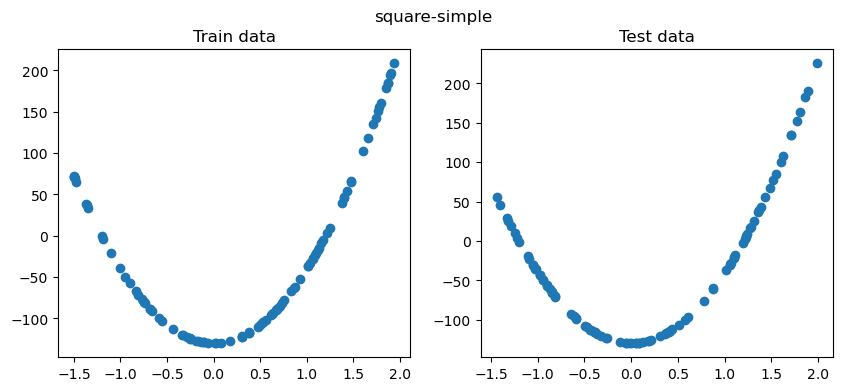

In [3]:
plot_data(title="square-simple",df_test=df_square_test,df_train=df_square)

Widać, że dane pochodzą z funkcji kwadratowej, tak jak mówi ich nazwa. Chcemy wykorzystać naszą sieć w regresji.

##### Sieć z jedną warstwą ukrytą o 5 neuronach

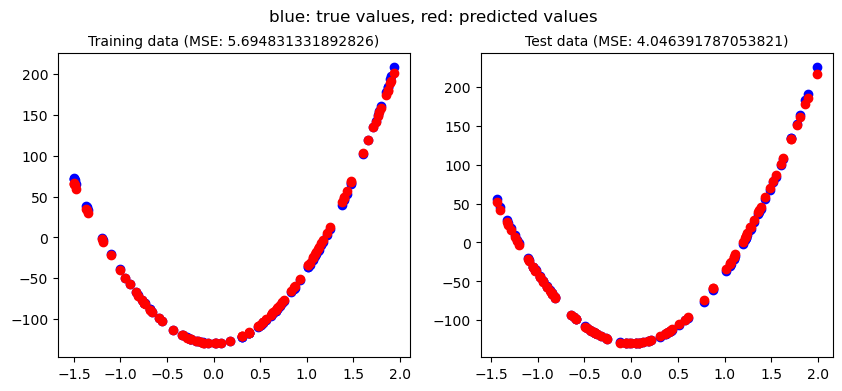

In [4]:
mlp = MLP(1,1, [5])

# hidden layer
mlp.layers[0].weights = np.array([1,1,1,1,1]).reshape(1,5)
mlp.layers[0].bias = np.array([2.3, 2, 10, -2, -2.3])
mlp.layers[0].activation = sigmoid

# output layer
mlp.layers[1].weights = np.array([-1000, -280, 1, 5, 1360]).reshape(5,1)
mlp.layers[1].bias = np.array([900])
mlp.layers[1].activation = linear

plot_predictions(mlp, df_square, df_square_test)

Na powyższym wykresie są punkty ze zbioru treningowego. Na niebiesko zaznaczone są prawdziwe wartości, a na czerwono te przewidziane przez sieć.


##### Sieć z jedną warstwą ukrytą o 10 neuronach

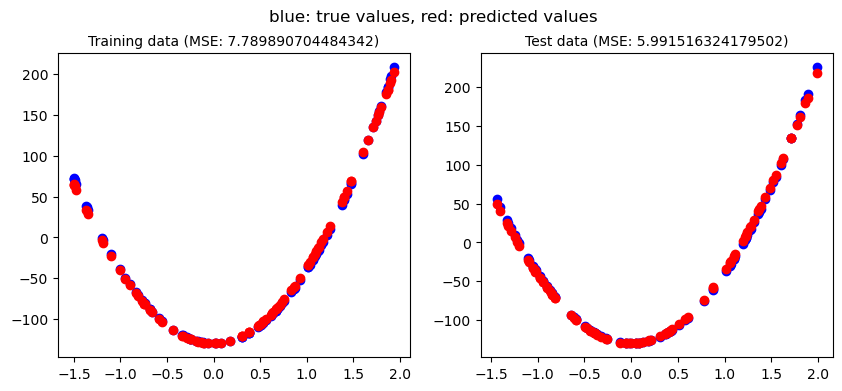

In [5]:
mlp = MLP(1,1, [10])

# hidden layer
mlp.layers[0].weights = np.array([1,1,1,1,1,1,1,1,1,1]).reshape(1,10)
mlp.layers[0].bias = np.array([2.3, 2,1,1,10, 10,1,1, -2, -2.3])
mlp.layers[0].activation = sigmoid

# output layer
mlp.layers[1].weights = np.array([-1000, -280, 1,1,1,1,1,1, 5, 1360]).reshape(10,1)
mlp.layers[1].bias = np.array([896]),
mlp.layers[1].activation = linear

plot_predictions(mlp, df_square, df_square_test)


Można zobaczyć po wartościach wag i biasów, że nie trzeba w tym przypadku dużo zmieniać w porównaniu z poprzednią siecią. Po prostu dodałem jedynki w kilku miejscach, żeby zgadzały się wymiary.

##### Sieć z dwiema warstwami ukrytymi po 5 neruonów

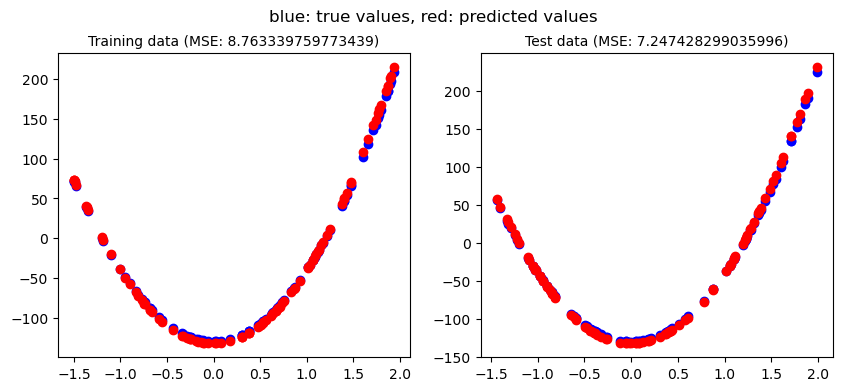

In [6]:
mlp = MLP(1,1, [5,5])

# hidden layer 1
mlp.layers[0].weights =np.array([-1.2 ,  0.7, -0.03,  1.2 , -1]).reshape(1,5)
mlp.layers[0].bias = np.array([-2.25 , -1.6 ,  0.8, -2.8  ,  2.1])
mlp.layers[0].activation = sigmoid

# hidden layer 2
mlp.layers[1].weights = np.array([
    [-2.6 , -0.6, -0.2, -1.3 ,  0.7],
    [-0.8 , -2.3 , -0.2, -0.6, -1.5  ],
    [-0.7 , -0.5, -2.4  , -0.9, -0.8],
    [-1.2  , -0.2 ,  0.4, -3  ,  1.2 ],
    [-1 , -0.6 , -0.4 , -1.3 ,  0.02]
]).T
mlp.layers[1].bias = np.array([ 0.5,  0.2, -0.1,  0.7,  0.6 ])
mlp.layers[1].activation = sigmoid

mlp.layers[2].weights = np.array([-1100,-300,-10,-200,-1000]).reshape(5,1)
mlp.layers[2].bias = np.array([1300]),
mlp.layers[2].activation = linear

plot_predictions(mlp, df_square, df_square_test)

Tutaj dopasowywanie wag i biasów ręcznie jest dużo bardziej skomplikowane, ponieważ jest dużo więcej parametrów., ale widać, że sieć da się dopasować się do danych.

#### 2. steps-large 

In [10]:
df_steps = pd.read_csv("data/regression/steps-large-training.csv",index_col=0)
df_steps_test = pd.read_csv("data/regression/steps-large-test.csv",index_col=0)
df_steps.head() 

,x,y
1,-1.481354,-80
2,1.033264,80
3,-0.076403,0
4,-1.419785,-80
5,-0.108398,0


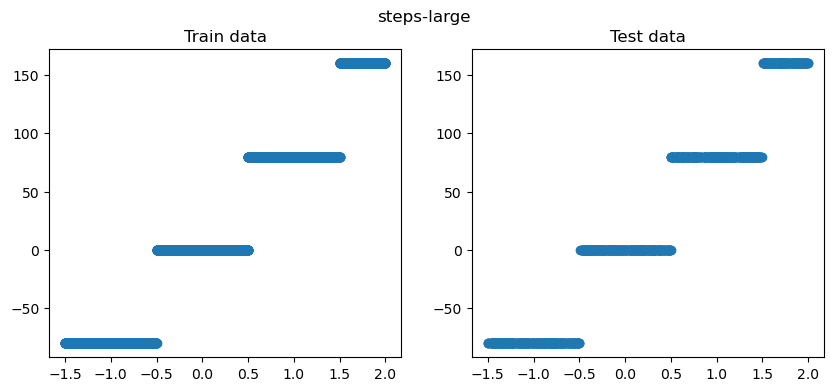

In [11]:
plot_data(title="steps-large",df_train = df_steps, df_test = df_steps_test)

Wartości zbioru to takie schody. 

##### Jedna warstwa ukryta o 5 neuronach


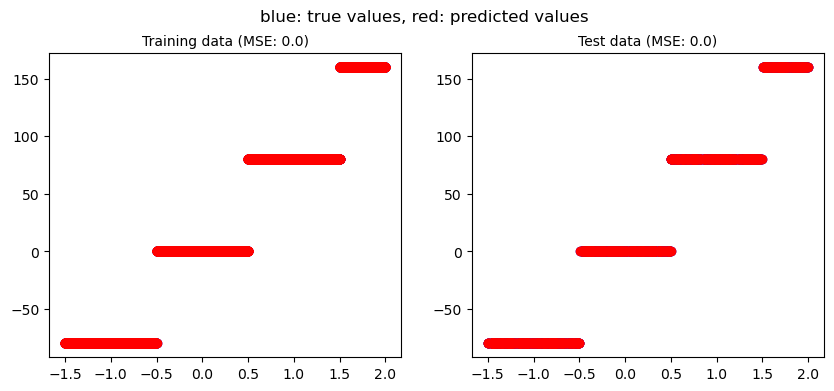

In [13]:
mlp = MLP(1,1, [5])

# hidden layer
mlp.layers[0].weights = np.array([ 20000000, 25000000, 40000000 , 0, 0]).reshape(1,5)
mlp.layers[0].bias = np.array([-30000000, -12500000, 20000000, 0,  0])
mlp.layers[0].activation = sigmoid

# output layer
mlp.layers[1].weights = np.array([ 80,80,80,0,0]).reshape(5,1)
mlp.layers[1].bias = np.array([-80])
mlp.layers[1].activation = linear

plot_predictions(mlp, df_steps, df_steps_test)

Tutaj sieć udało się dopasować idealnie, używając bardzo dużych wartości, aby skoki były jak "najszybsze" (chodzi o to, aby nie przewidywało wartości pomiędzy skokami).

##### Jedna warstwa ukryta o 10 neuronach


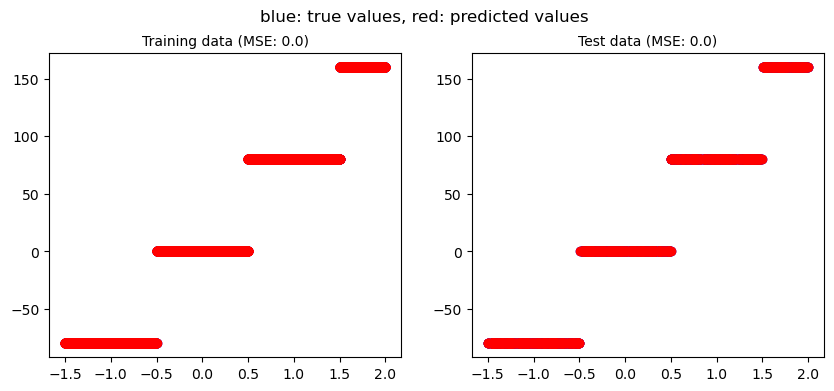

In [17]:
mlp = MLP(1,1, [5])

# hidden layer
mlp.layers[0].weights =np.array([ 20000000, 25000000, 40000000 , 0, 0, 0, 0, 0, 0,0]).reshape(1,10)
mlp.layers[0].bias = np.array([-30000000, -12500000, 20000000, 0,  0,0 , 0, 0, 0, 0])
mlp.layers[0].activation = sigmoid

# output layer
mlp.layers[1].weights = np.array([ 80,80,80,0,0,0,0,0,0,0]).reshape(10,1)
mlp.layers[1].bias = np.array([-80])
mlp.layers[1].activation = linear

plot_predictions(mlp, df_steps, df_steps_test)


##### Dwie warstwy ukryte po 10 neuronów


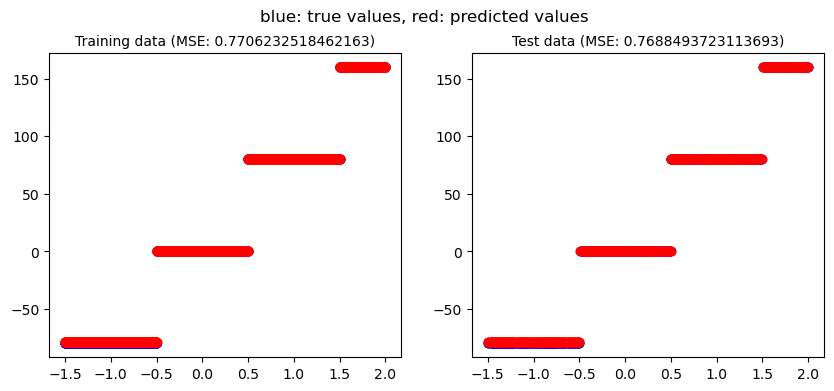

In [19]:
mlp = MLP(1,1, [5,5])

# hidden layer 1
mlp.layers[0].weights = np.array([ 20000000, 25000000, 40000000, 0, 0]).reshape(1,5)
mlp.layers[0].bias = np.array([-30000000, -12500000, 20000000, 0,  0])
mlp.layers[0].activation = sigmoid

# hidden layer 2
mlp.layers[1].weights = np.array([ 
    [20000000, 1, 1, -30, -30],
    [25000000, 1, 1, 10, -15],
    [40000000, 1, 1, 2, 0.7],
    [0, 0, 0, 6.6, 0],
    [0, 0, 0, 8.7, 8.2]
])
mlp.layers[1].bias = np.array([-30000000, -12500000, 20000000, 0,  -0.1])
mlp.layers[1].activation = sigmoid

# output layer
mlp.layers[2].weights = np.array([ 80,80,120,-80, -80]).reshape(5,1)
mlp.layers[2].bias = np.array([-40])
mlp.layers[2].activation = linear

plot_predictions(mlp, df_steps, df_steps_test)

Ogólne przemyślenia do tej pory są takie, że nie jest tak trudno zgadnąć niezłe wagi dla niewielkich sieci, szczególnie dla sieci o jednej warstwie z pięcioma neuronami. Im bardziej skomplikowana sieć tym trudniej się połapać jaki wpływ mają poszczególne parametry.

## LAB 2 - Propagacja wsteczna błędu

Dalsza implementacja sieci. Tutaj skupiam się na:

* uczeniu sieci neuronowej propagacją wsteczną błędu z aktualizacją wag po:
    1. wszystkich wzorcach
    2. pojedynczym wzorcu
    3. wzorcach w batchu
* porównaniu czasu uczenia dla tych wersji
* wizualizacji wartości wag sieci

#### 1. square-simple

In [1]:
from MLP import *  
df_train = pd.read_csv("data/regression/square-simple-training.csv",index_col=0)
df_test = pd.read_csv("data/regression/square-simple-test.csv",index_col=0)
df_train.head()

,x,y
1,-0.171543,-127.351580
2,0.025201,-129.942844
3,-1.368991,38.672367
4,1.907390,197.432191
5,0.011129,-129.988852


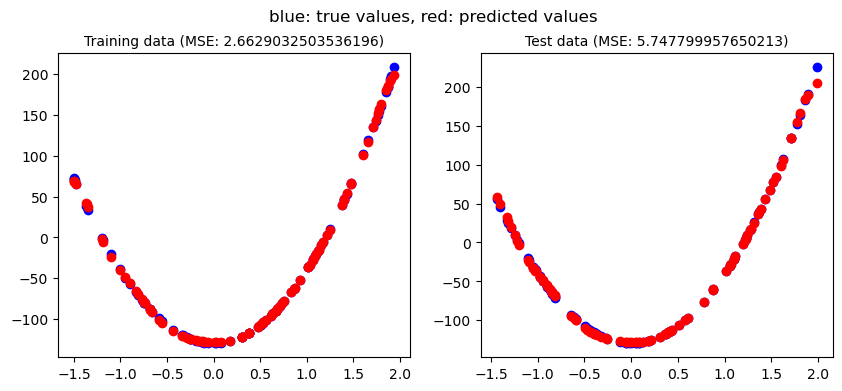

In [9]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[30])
time1, mse1, epochs1 =  mlp.fit(df_train["x"],df_train["y"], epochs=100000, learning_rate=0.002, batch_size=-1, loss_stop=1)
plot_predictions(mlp, df_train, df_test)

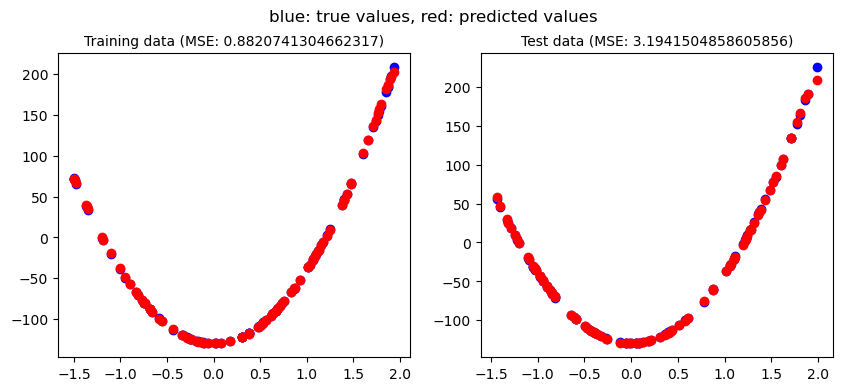

In [10]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[50])
time2, mse2, epochs2 =  mlp.fit(df_train["x"],df_train["y"], epochs=20000, learning_rate=0.01, batch_size=1,loss_stop=1)
plot_predictions(mlp, df_train, df_test)

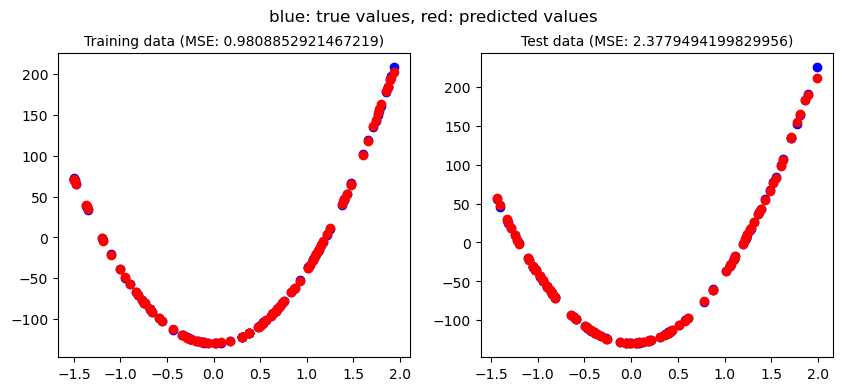

In [11]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[50])
time3, mse3, epochs3 =  mlp.fit(df_train["x"],df_train["y"], epochs=20000, learning_rate=0.01, batch_size=16,loss_stop=1)
plot_predictions(mlp, df_train, df_test)


Text(0.5, 1.0, 'MSE evolution')

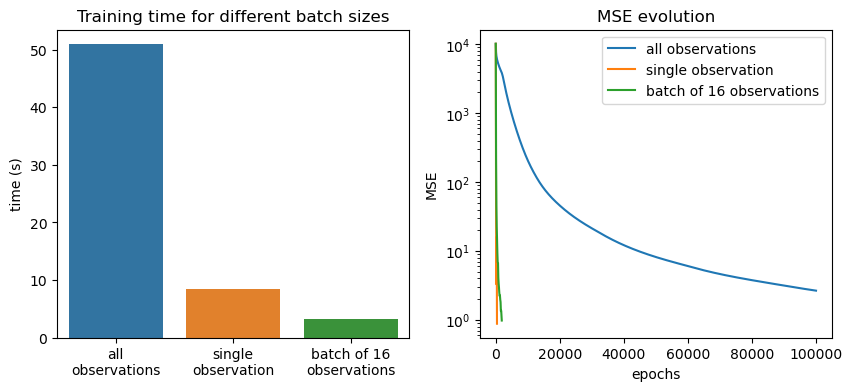

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))
batch_size = 16

labels = ["all observations","single observation",f"batch of {batch_size} observations"]

axes[0] = sns.barplot(x=["all\nobservations", "single\nobservation",f"batch of {batch_size}\nobservations"],y=[time1,time2,time3], ax=axes[0])
axes[0].set_title("Training time for different batch sizes")
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=np.concatenate([np.arange(1,(len(mse1)-1)*100+1,100),[epochs1]]),y=mse1,label="all observations") 
axes[1] = sns.lineplot(x=np.concatenate([np.arange(1,(len(mse2)-1)*100+1,100),[epochs2]]),y=mse2,label="single observation")
axes[1] = sns.lineplot(x=np.concatenate([np.arange(1,(len(mse3)-1)*100+1,100),[epochs3]]),y=np.array(mse3),label=f"batch of {batch_size} observations")
axes[1].set_yscale("log")
axes[1].set_xlabel("epochs")
axes[1].set_ylabel("MSE")
axes[1].set_title("MSE evolution")



#### 2. steps-small

In [6]:
df_train = pd.read_csv("data/regression/steps-small-training.csv",index_col=0)
df_test = pd.read_csv("data/regression/steps-small-test.csv",index_col=0)
df_train.head()


,x,y
1,1.786896,160
2,1.189037,80
3,-0.917923,-80
4,-0.518967,-80
5,-0.011570,0


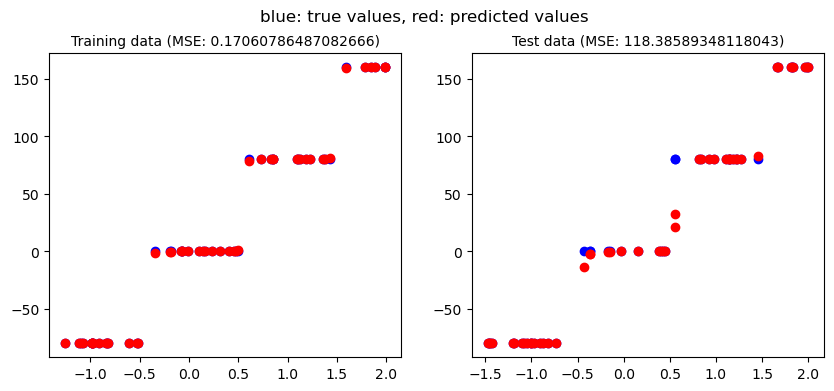

In [7]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[15,15,15])
time1, mse1, epochs1 =  mlp.fit(df_train["x"],df_train["y"], epochs=10000, learning_rate=0.01, batch_size=-1, loss_stop=0.1)
plot_predictions(mlp, df_train, df_test)

Na tym wykresie widać, że pomimo idealnego wytrenowania na zbiorze treningowym, nie otrzymuje dobrych wyników na zbiorze testowym. Wydaję mi się, że to przez niefortunny podział.

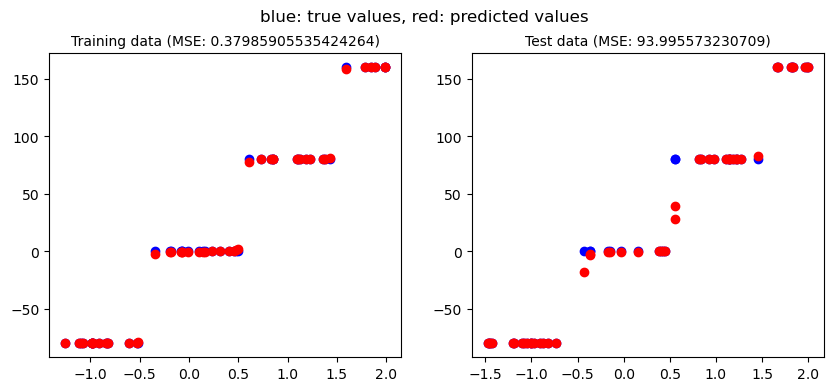

In [10]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[15,15,15])
time2, mse2, epochs2 =  mlp.fit(df_train["x"],df_train["y"], epochs=1000, learning_rate=0.001, batch_size=1,  loss_stop=0.1)

plot_predictions(mlp, df_train, df_test)

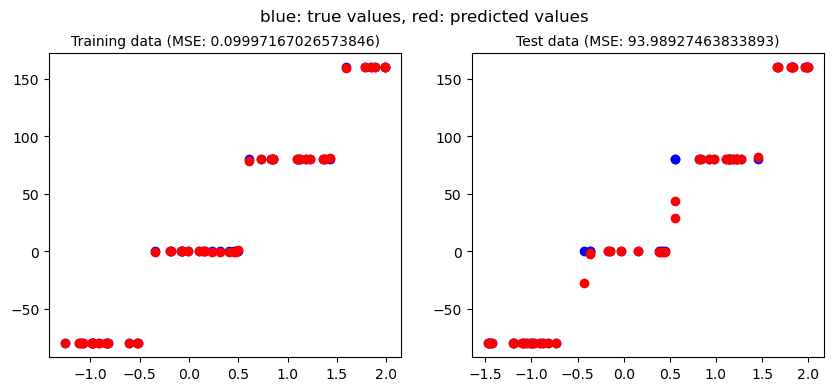

In [89]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[15,15,15])
time3, mse3, epochs3 =  mlp.fit(df_train["x"],df_train["y"], epochs=10000, learning_rate=0.01, batch_size=16,  loss_stop=0.1)

plot_predictions(mlp, df_train, df_test)

Text(0.5, 1.0, 'MSE evolution')

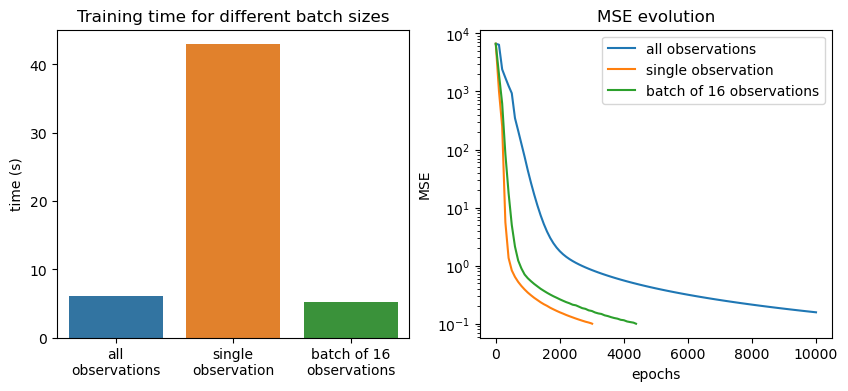

In [90]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))
batch_size = 16

labels = ["all observations","single observation",f"batch of {batch_size} observations"]

axes[0] = sns.barplot(x=["all\nobservations", "single\nobservation",f"batch of {batch_size}\nobservations"],y=[time1,time2,time3], ax=axes[0])
axes[0].set_title("Training time for different batch sizes")
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=np.concatenate([np.arange(1,(len(mse1)-1)*100+1,100),[epochs1]]),y=mse1,label="all observations") 
axes[1] = sns.lineplot(x=np.concatenate([np.arange(1,(len(mse2)-1)*100+1,100),[epochs2]]),y=mse2,label="single observation")
axes[1] = sns.lineplot(x=np.concatenate([np.arange(1,(len(mse3)-1)*100+1,100),[epochs3]]),y=np.array(mse3),label=f"batch of {batch_size} observations")
axes[1].set_yscale("log")
axes[1].set_xlabel("epochs")
axes[1].set_ylabel("MSE")
axes[1].set_title("MSE evolution")

In [91]:
df_train = pd.read_csv("data/regression/multimodal-large-training.csv")
df_test = pd.read_csv("data/regression/multimodal-large-test.csv")
df_train.head()

,x,y
0,-0.685726,-74.197483
1,-0.879898,-30.504177
2,1.411932,10.754122
3,1.688954,100.248297
4,-0.573238,-73.832310


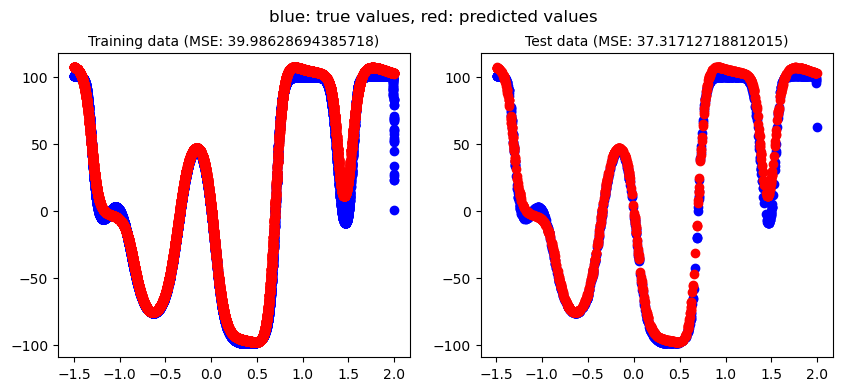

In [92]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[100])
time1, mse1, epochs1 =  mlp.fit(df_train["x"],df_train["y"], epochs=100000, learning_rate=0.05, batch_size=-1, loss_stop=40)

plot_predictions(mlp, df_train, df_test)

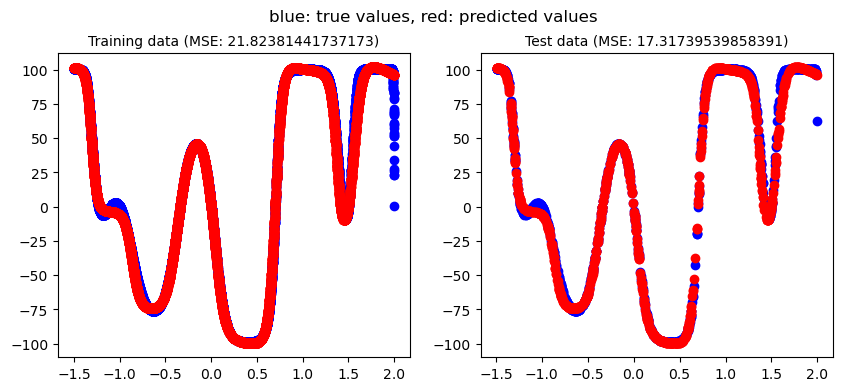

In [93]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[100])
time2, mse2, epochs2 =  mlp.fit(df_train["x"],df_train["y"], epochs=10000, learning_rate=0.005, batch_size=1, loss_stop=40)

plot_predictions(mlp, df_train, df_test)

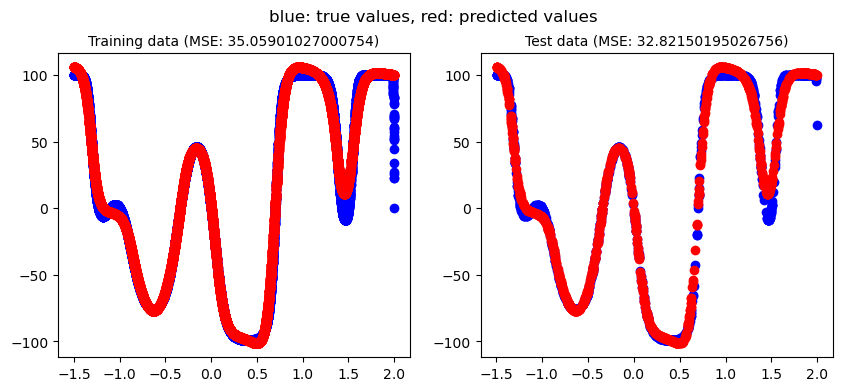

In [94]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[100])
time3, mse3, epochs3 =  mlp.fit(df_train["x"],df_train["y"], epochs=100000, learning_rate=0.05, batch_size=256, loss_stop=40)

plot_predictions(mlp, df_train, df_test)

Text(0.5, 1.0, 'MSE evolution')

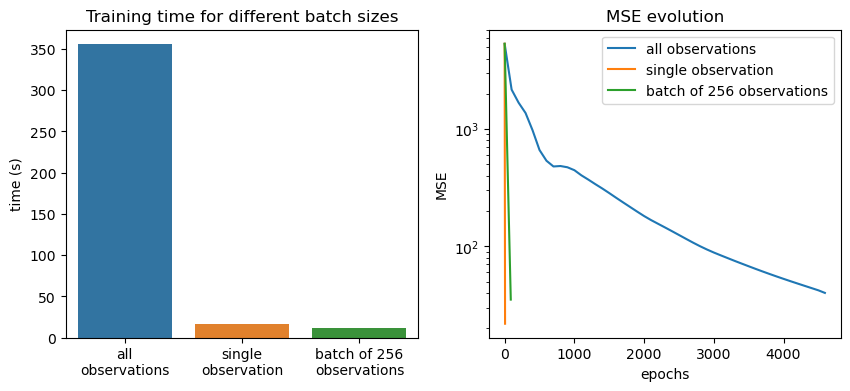

In [96]:
fig, axes = plt.subplots(1, 2, figsize=(10,4))
batch_size = 256

labels = ["all observations","single observation",f"batch of {batch_size} observations"]

axes[0] = sns.barplot(x=["all\nobservations", "single\nobservation",f"batch of {batch_size}\nobservations"],y=[time1,time2,time3], ax=axes[0])
axes[0].set_title("Training time for different batch sizes")
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=np.concatenate([np.arange(1,(len(mse1)-1)*100+1,100),[epochs1]]),y=mse1,label="all observations") 
axes[1] = sns.lineplot(x=np.concatenate([np.arange(1,(len(mse2)-1)*100+1,100),[epochs2]]),y=mse2,label="single observation")
axes[1] = sns.lineplot(x=np.concatenate([np.arange(1,(len(mse3)-1)*100+1,100),[epochs3]]),y=np.array(mse3),label=f"batch of {batch_size} observations")
axes[1].set_yscale("log")
axes[1].set_xlabel("epochs")
axes[1].set_ylabel("MSE")

axes[1].set_title("MSE evolution")

### Wizualizacja wag

In [13]:
from MLP import *
df_train = pd.read_csv("data/regression/steps-small-training.csv",index_col=0)
df_test = pd.read_csv("data/regression/steps-small-test.csv",index_col=0)
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[15])

<Figure size 640x480 with 0 Axes>

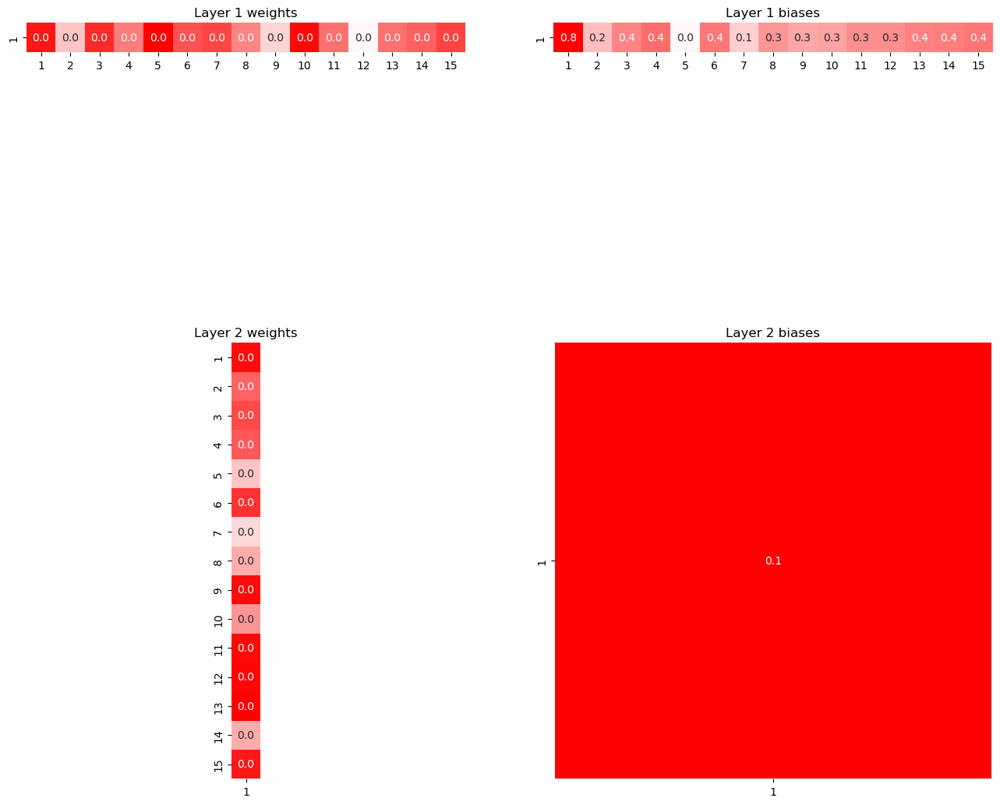

In [14]:
mlp.plot_weights()

<Figure size 640x480 with 0 Axes>

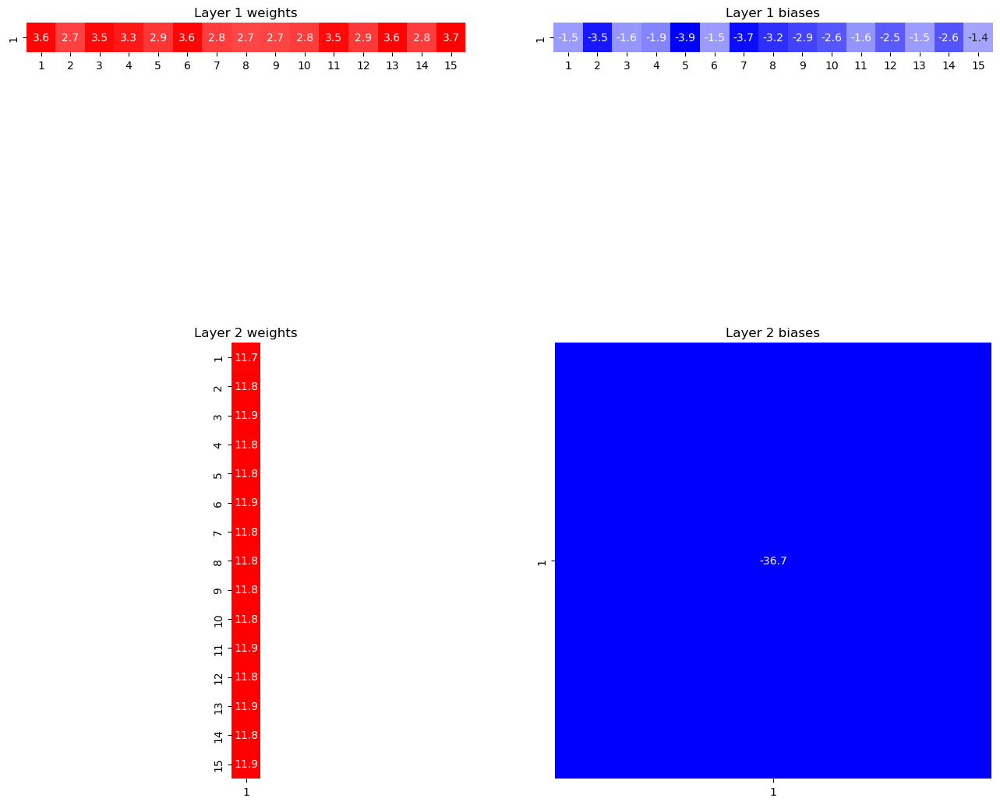

In [15]:
time, mse, epochs =  mlp.fit(df_train["x"],df_train["y"], epochs=100, learning_rate=0.01, batch_size=16, loss_stop=0.1)
mlp.plot_weights()

<Figure size 640x480 with 0 Axes>

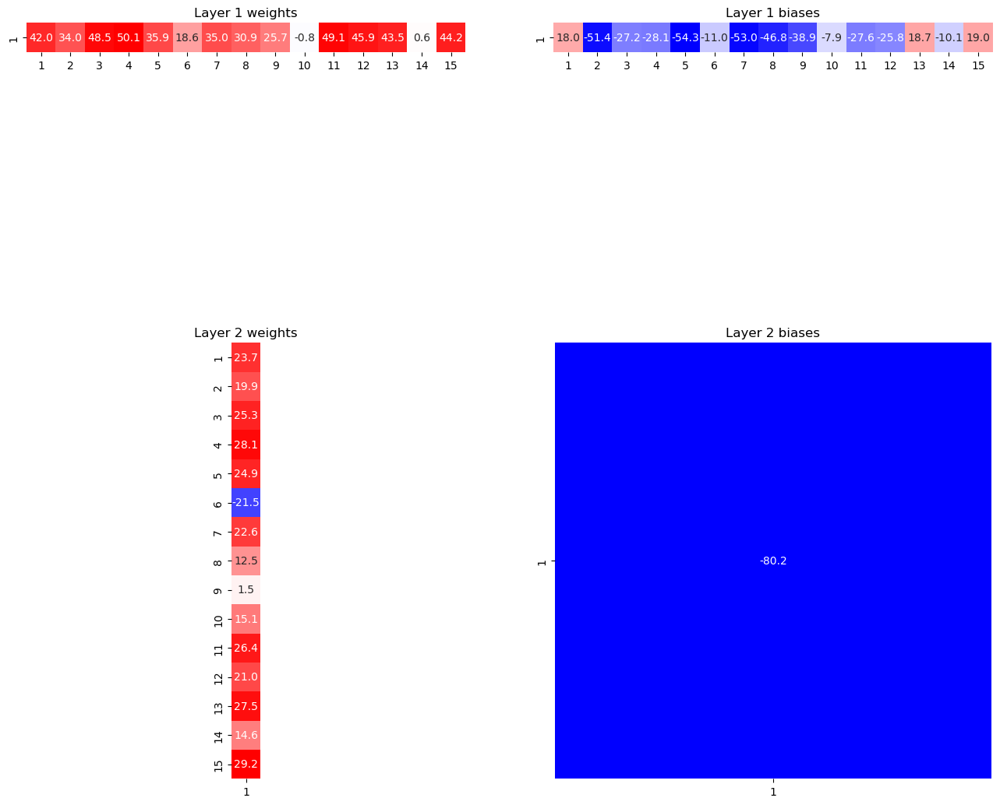

In [17]:
time, mse, epochs =  mlp.fit(df_train["x"],df_train["y"], epochs=50000, learning_rate=0.01, batch_size=16, loss_stop=0.1)
mlp.plot_weights()

## LAB 3 - uczenie z momentem i normalizacja gradientu

Na tym labie do implementacji MLP, dodaje możliość uczenia przy użyciu:

- uczenia z momentem
- normalizacji gradientu (RMSProp)
- Adam Optimizer (uczenie z momentem + RMSProp)

#### square large

In [1]:
from MLP import *
np.random.seed(1234)
df_train = pd.read_csv("data/regression/square-large-training.csv",index_col=0)
df_test = pd.read_csv("data/regression/square-large-test.csv",index_col=0)


Na początku dla porówniania sieć nie używająca uczenia z momentem, ani normalizacji gradientu.

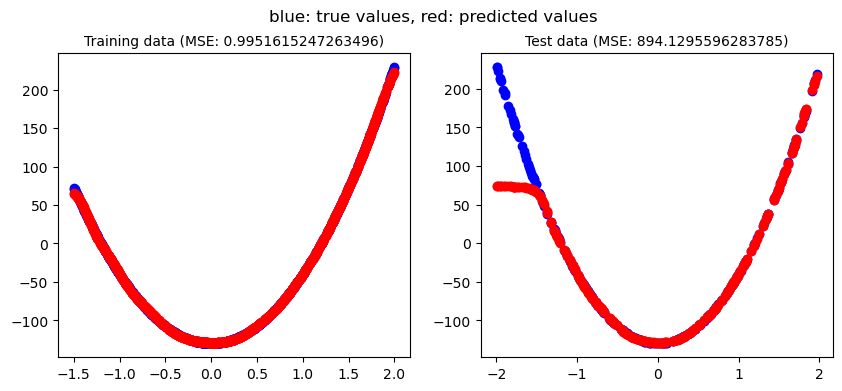

In [6]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[30]) 
times0, mse0, epochs0 = mlp.fit(df_train["x"],df_train["y"], epochs=2000, learning_rate=0.005,normalisation_coef=0, momentum_coef=0, batch_size=32, loss_stop=1)
plot_predictions(mlp, df_train, df_test)

Widać z wykresu, że podział na zbiór treningowy i testowy nie jest dobry. W zbiorze treningowym nie ma wcale wartości poniżej -1.5, a testowym jest ich wiele. 
Oprócz tego z odpalania uczenia sieci kilka razy z tym samym seedem z jakiegoś powodu czasy uczenia różnią się, więc w celu dokładniejszego porównania będę wykonywał kilka uczeń i jakoś je uśredniał.

Eksperyment będzie wyglądał następująco:

- fituję ustawienia sieci po 10 razy na maksymalej liczbie epoch 1000. Jeśli model nie osiągnął oczekiwanego mse w 1000 epoch znaczy, że jest słabo
- patrze na to jak przeciętnie uczy się każda sieć
- patrzę na wyniki najlepsze i wyniki najgorze

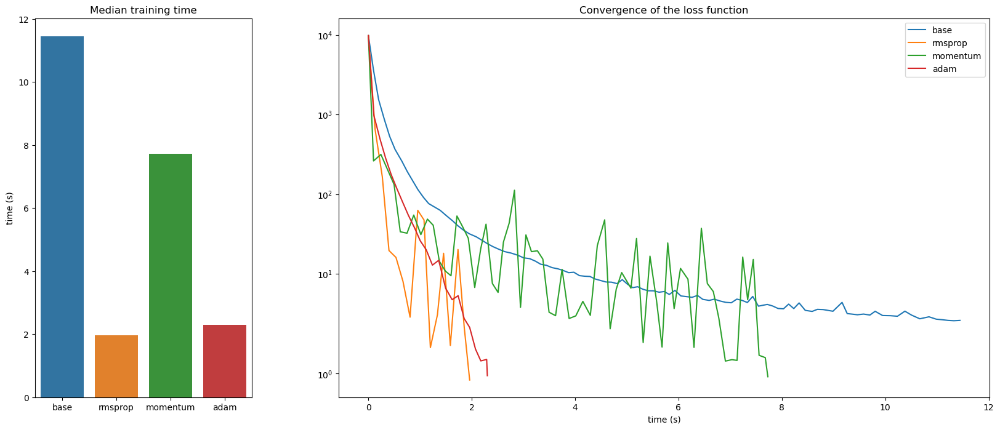

In [2]:
results = benchmark(df_train["x"],df_train["y"],hidden=[30], epochs=1000, batch_size=32, loss_stop=1, range_=10,
                         learning_rate_base=0.005, learning_rate_rmsprop=0.1, learning_rate_momentum=0.05,learning_rate_adam=0.1,
                         normalisation_coef= 0.99, momentum_coef=0.3, adam_coefs=[0.999,0.6])


In [3]:
results

,end_time_base,end_time_rmsprop,end_time_momentum,end_time_adam,end_epoch_base,end_epoch_rmsprop,end_epoch_momentum,end_epoch_adam,end_mse_base,end_mse_rmsprop,end_mse_momentum,end_mse_adam
0,13.049803,5.660595,13.780829,2.378976,1000,333,1000,202,5.031778,0.987854,11.639798,0.948849
1,11.297692,4.019017,13.743248,2.455969,1000,285,1000,210,2.676548,0.971693,34.655548,0.883489
2,11.970522,1.723323,10.587223,2.403061,1000,148,1000,207,2.594821,0.856373,21.263482,0.945909
3,10.171280,2.024465,1.507686,2.345821,1000,181,149,197,2.760054,0.827108,0.984919,0.965371
4,9.957027,2.013632,2.930712,2.293722,1000,190,288,201,1.055400,0.981273,0.964793,0.954141
5,10.174878,0.887946,6.575872,1.823518,974,81,634,154,0.991402,0.973619,0.930462,0.880578
6,10.564576,0.989901,3.205489,2.458713,1000,89,286,206,1.363619,0.738408,0.877551,0.949449
7,10.187965,10.682149,4.818050,1.433439,1000,1000,486,135,3.016018,8.886140,0.960656,0.904315
8,9.904317,0.679778,10.596910,2.342849,1000,63,1000,206,2.475909,0.936472,30.646256,0.918723
9,9.786626,1.303979,10.379586,1.109744,927,116,1000,92,0.996972,0.976724,5.057830,0.826389


#### steps-large

In [3]:
df_train = pd.read_csv("data/regression/steps-large-training.csv",index_col=0)
df_test = pd.read_csv("data/regression/steps-large-test.csv",index_col=0)

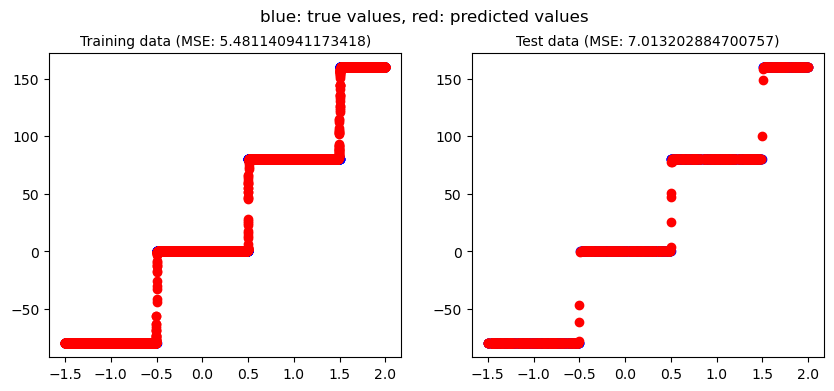

In [63]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[10,10]) 
times0, mse0, epochs0 = mlp.fit(df_train["x"],df_train["y"], epochs=10000, learning_rate=0.01,momentum_coef=0.9,normalisation_coef=0.99, batch_size=256, loss_stop=3)
plot_predictions(mlp, df_train, df_test)

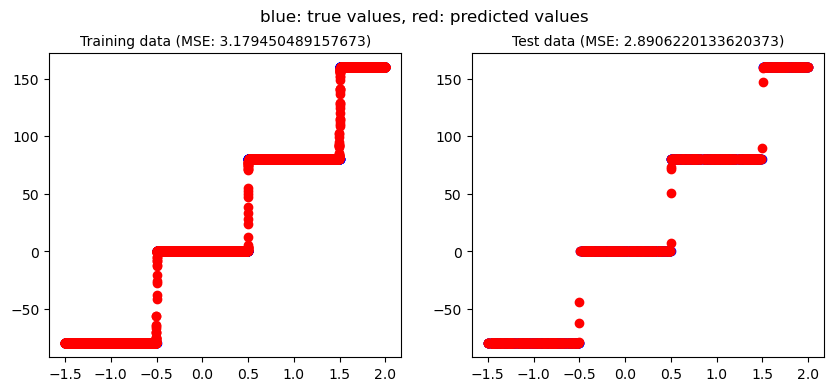

In [52]:
times0, mse0, epochs0 = mlp.fit(df_train["x"],df_train["y"], epochs=1000, momentum_coef =0, normalisation_coef = 0,learning_rate=0.000001, batch_size=256, loss_stop=3.1)
plot_predictions(mlp, df_train, df_test)


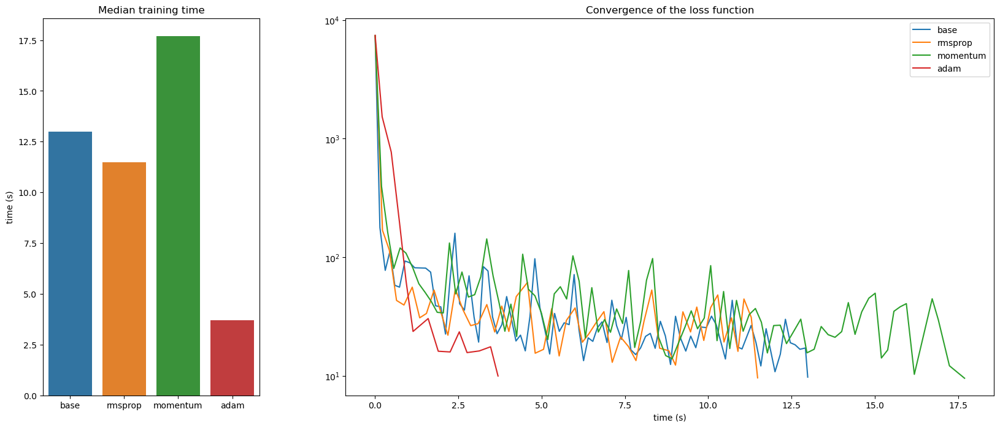

In [101]:
results = benchmark(df_train["x"],df_train["y"],hidden=[10,10], epochs=1000, batch_size=500, loss_stop=10, range_=10,
                         learning_rate_base=0.05, learning_rate_rmsprop=0.1, learning_rate_momentum=0.05,learning_rate_adam=0.1,
                         normalisation_coef= 0.999, momentum_coef=0.3, adam_coefs=[0.999,0.99])

In [102]:
results

,end_time_base,end_time_rmsprop,end_time_momentum,end_time_adam,end_epoch_base,end_epoch_rmsprop,end_epoch_momentum,end_epoch_adam,end_mse_base,end_mse_rmsprop,end_mse_momentum,end_mse_adam
0,17.534774,11.482506,23.272365,4.674429,666,509,1000,224,9.827256,9.615006,30.525863,9.633327
1,12.152274,14.538674,17.696102,6.848808,616,721,876,165,9.890441,9.147143,9.544936,9.877997
2,11.113553,13.866409,55.921710,14.638275,554,578,991,258,9.340823,9.261940,9.411488,9.817225
3,28.658779,11.580659,19.625460,3.930009,704,560,1000,182,9.942720,9.516446,16.283298,9.895498
4,22.432580,10.205364,15.199412,4.829153,760,478,810,192,9.967699,9.959890,9.192688,9.857913
5,20.883012,12.686888,27.567879,3.688788,802,476,1000,127,9.397057,9.478201,19.766764,9.968039
6,15.740198,11.652816,36.277605,3.348807,719,458,1000,174,9.526905,9.653949,39.824882,9.803618
7,11.435675,9.943736,15.293644,1.861615,641,562,972,112,9.892536,9.722624,9.987103,9.444182
8,12.483064,7.912503,15.177488,1.759152,834,496,1000,111,8.582689,9.750107,31.363288,9.651580
9,12.987055,10.251363,12.164672,2.650949,845,652,827,169,9.754170,9.976806,9.762683,9.709270


#### multimodal-large

In [104]:
df_train = pd.read_csv("data/regression/multimodal-large-training.csv")
df_test = pd.read_csv("data/regression/multimodal-large-test.csv")

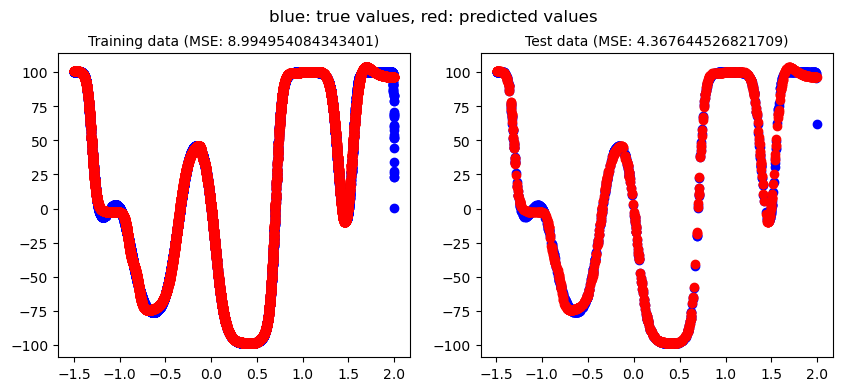

In [110]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[100]) 
times0, mse0, epochs0 = mlp.fit(df_train["x"],df_train["y"], epochs=1000, learning_rate=0.1,momentum_coef=0.9,normalisation_coef=0.99, batch_size=500, loss_stop=9)
plot_predictions(mlp, df_train, df_test)

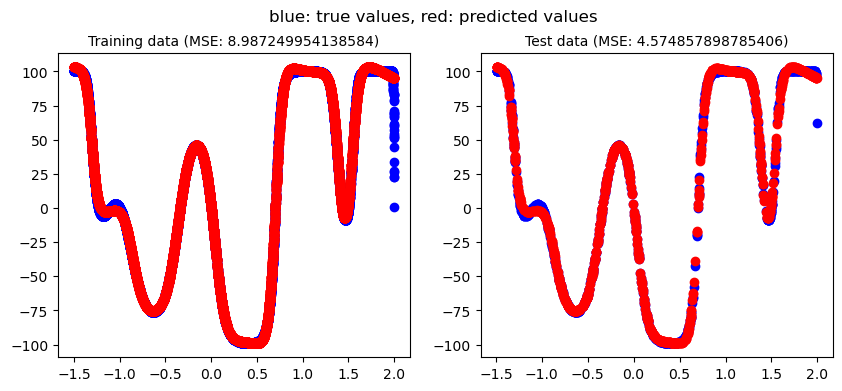

In [155]:
mlp = MLP(input_dim=1, output_dim=1, hidden_dims=[100]) 
times0, mse0, epochs0 = mlp.fit(df_train["x"],df_train["y"], epochs=1000, learning_rate=0.05,momentum_coef=0.05,normalisation_coef=0, batch_size=500, loss_stop=9)
plot_predictions(mlp, df_train, df_test)

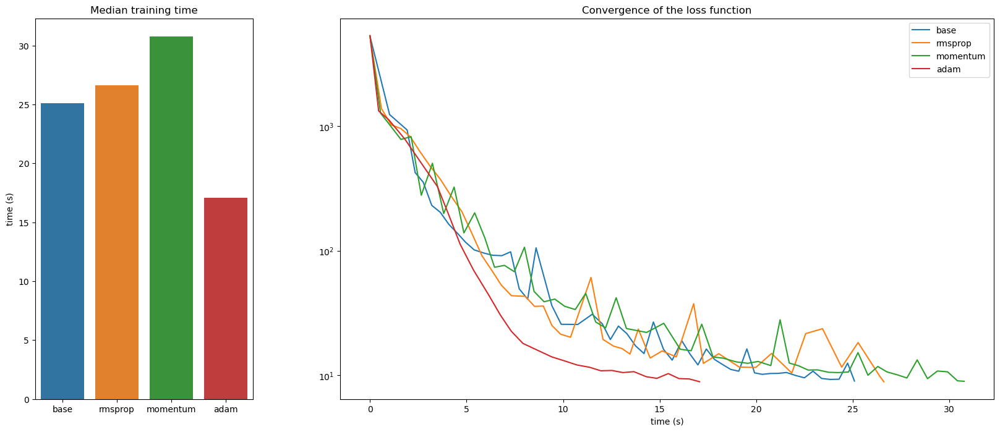

In [157]:
results = benchmark(df_train["x"],df_train["y"],hidden=[100], epochs=1000, batch_size=500, loss_stop=9, range_=10,
                         learning_rate_base=0.05, learning_rate_rmsprop=0.1, learning_rate_momentum=0.05,learning_rate_adam=0.1,
                         normalisation_coef= 0.999, momentum_coef=0.05, adam_coefs=[0.99,0.9])

In [145]:
results

,end_time_base,end_time_rmsprop,end_time_momentum,end_time_adam,end_epoch_base,end_epoch_rmsprop,end_epoch_momentum,end_epoch_adam,end_mse_base,end_mse_rmsprop,end_mse_momentum,end_mse_adam
0,24.755338,24.162233,18.924849,35.891602,1000,1000,1000,1000,2520.558817,1006.454763,2519.805457,2521.937655
1,26.646608,30.058207,25.620589,26.442234,1000,1000,1000,1000,2519.592962,1505.576641,2519.701823,2182.159998
2,30.117500,30.692605,26.876361,27.081868,1000,1000,1000,1000,2519.528026,3902.452014,1504.205096,2519.456461
3,27.057638,30.799880,30.597001,15.646580,1000,1000,1000,440,2519.566639,1450.577989,2519.851352,9.950159
4,25.592421,21.066833,19.084373,20.753320,1000,1000,1000,1000,1347.864746,2457.734945,2519.632972,2519.514218
5,18.450174,19.502353,18.925816,22.934199,1000,1000,1000,1000,2459.349130,1436.091377,2519.596320,548.759904
6,18.903030,23.399157,18.713160,26.411784,1000,1000,1000,1000,1519.505579,1502.847172,2519.685890,1501.962979
7,23.250874,24.309999,20.012784,21.679887,1000,1000,1000,1000,2520.854455,2185.840218,2519.671606,2519.872617
8,18.992373,20.148912,19.248025,8.847139,1000,1000,1000,412,2520.201499,5177.301564,2519.629538,9.745036
9,19.774011,20.936955,18.243875,20.043699,1000,1000,1000,1000,2519.613694,759.326032,2519.602019,1348.302765


## LAB 4 - rozwiązywanie zadań klasyfikacji


#### rings3-regular

In [1]:
from MLP import *
df_train = pd.read_csv("data/classification/rings3-regular-training.csv")
df_test = pd.read_csv("data/classification/rings3-regular-test.csv")

Score 0.9906641077583836 reached  after 270 epochs 9826531020620813


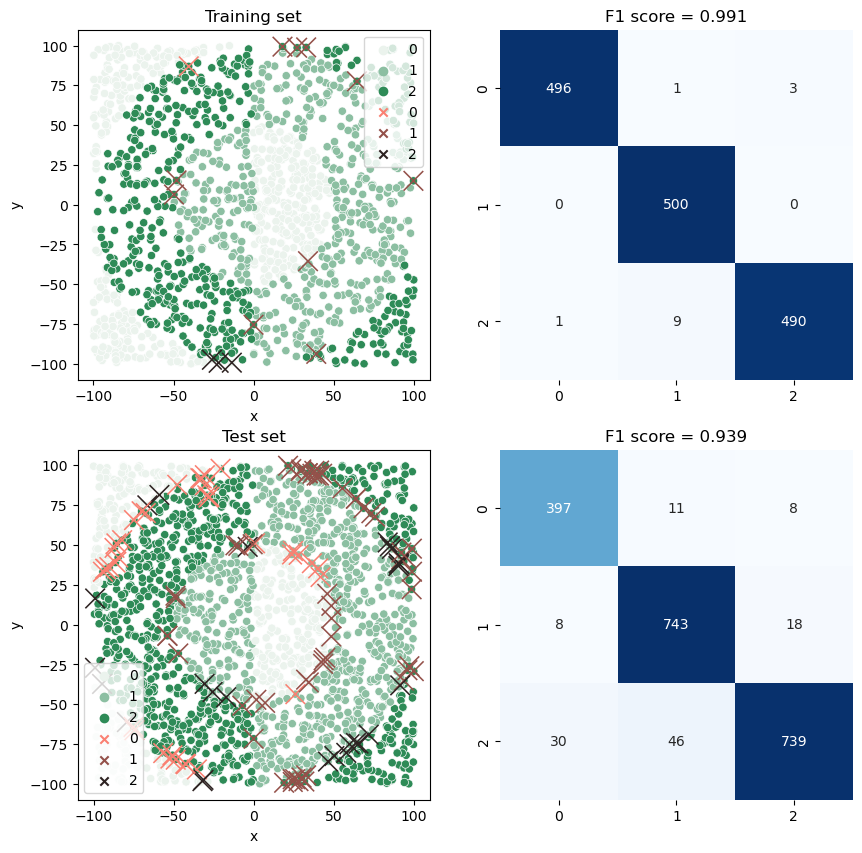

In [13]:
mlp = MLP(2,3,[100,100,100], classification = True)
times, mse, epochs, = mlp.fit(df_train[["x","y"]], df_train["c"], epochs=500, batch_size=100, learning_rate=0.001, shuffle=True, score_function=partial(f1_score,average="macro"),score_stop = 0.99)
plot_classification(mlp, df_train, df_test)

Score 0.9546979905255784 reached  after 80 epochs 
Score 0.9507493827836903 reached  after 413 epochs 93368778276086574


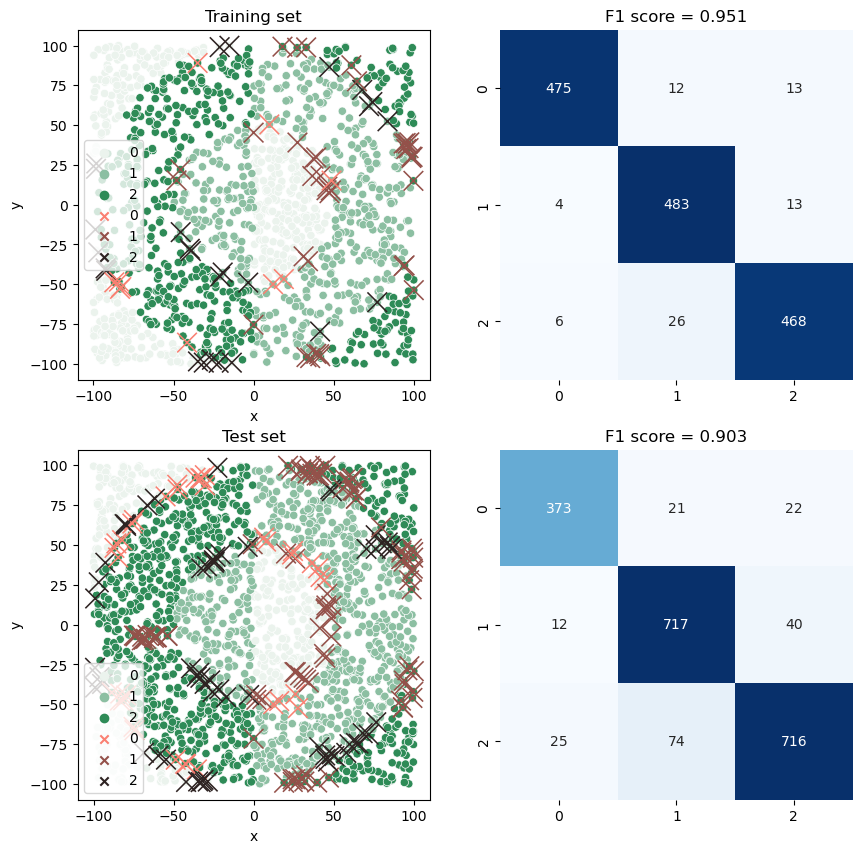

In [23]:
mlp = MLP(2,3,[100,100,100], classification = True)
times, mse, epochs, = mlp.fit(df_train[["x","y"]], df_train["c"], epochs=500, batch_size=100, learning_rate=0.001, shuffle=True, score_function=partial(f1_score,average="macro"),score_stop = 0.95)
mlp = MLP(2,3,[100,100,100], classification = True, output_activation = linear)
times_linear, mse_linear, epochs_linear, = mlp.fit(df_train[["x","y"]], df_train["c"], epochs=2000, batch_size=100, learning_rate=0.001, shuffle=True, score_function=partial(f1_score,average="macro"),score_stop = 0.95)
plot_classification(mlp, df_train, df_test)

Text(0.5, 0.98, 'Comparison for different output activation functions')

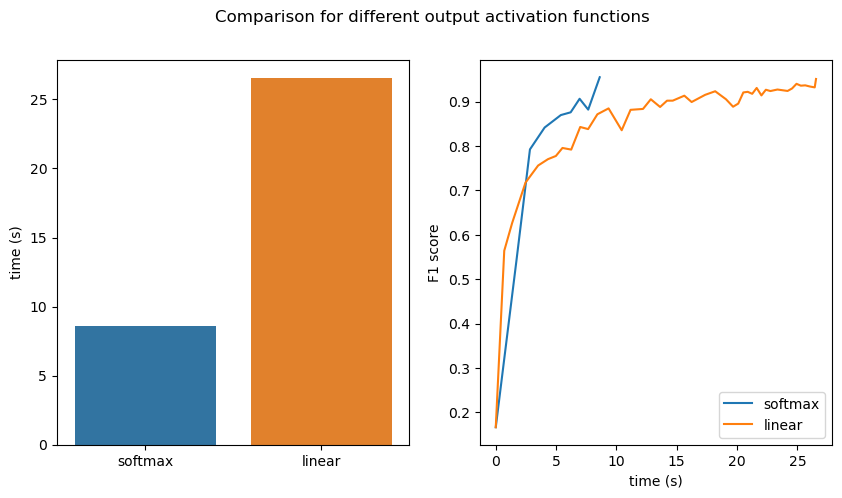

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))

labels = ["softmax","linear"]
axes[0] = sns.barplot(x=labels,y=[times[-1],times_linear[-1]], ax=axes[0])
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=times, y = mse, ax=axes[1], label="softmax")
axes[1] = sns.lineplot(x=times_linear, y = mse_linear, ax=axes[1], label="linear")
axes[1].set_xlabel("time (s)")
axes[1].set_ylabel("F1 score")
fig.suptitle("Comparison for different output activation functions")

#### easy 

In [28]:
df_train = pd.read_csv("data/classification/easy-training.csv")
df_test = pd.read_csv("data/classification/easy-test.csv")

Score 1.0 reached  after 5 epochs 


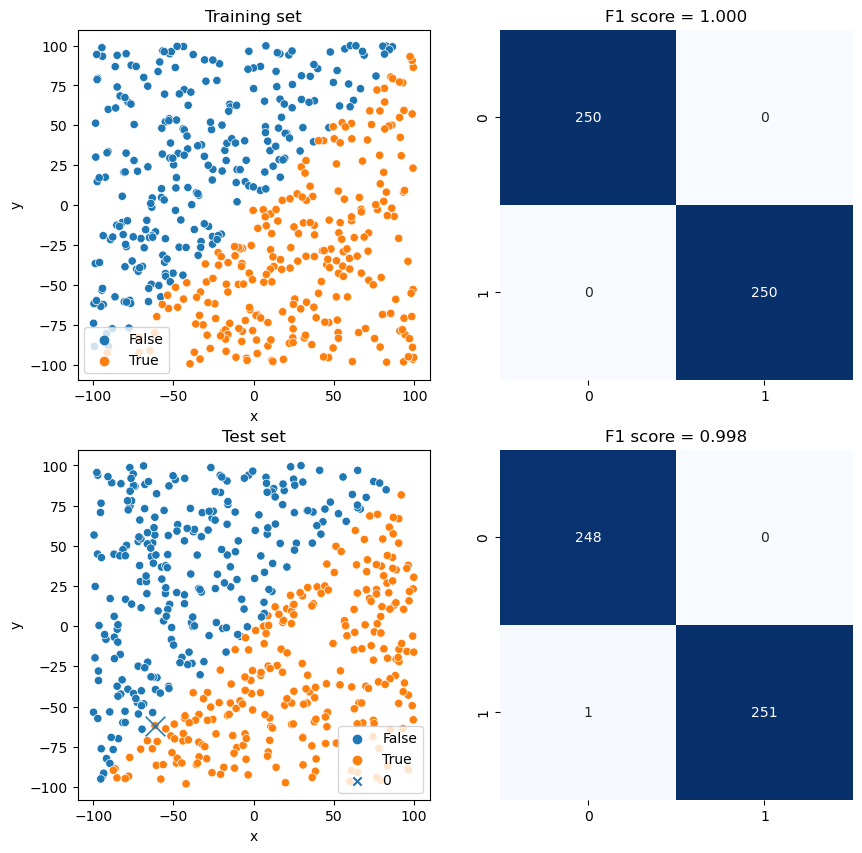

In [30]:
mlp = MLP(2,2,[100,100,100], classification = True)
times, mse, epcohs = mlp.fit(df_train[["x","y"]], df_train["c"], epochs=200, batch_size=100, learning_rate=0.001, shuffle=True, score_function=partial(f1_score,average="macro"),score_stop = 0.999)
plot_classification(mlp, df_train, df_test, some_error=True)

Score 1.0 reached  after 10 epochs 


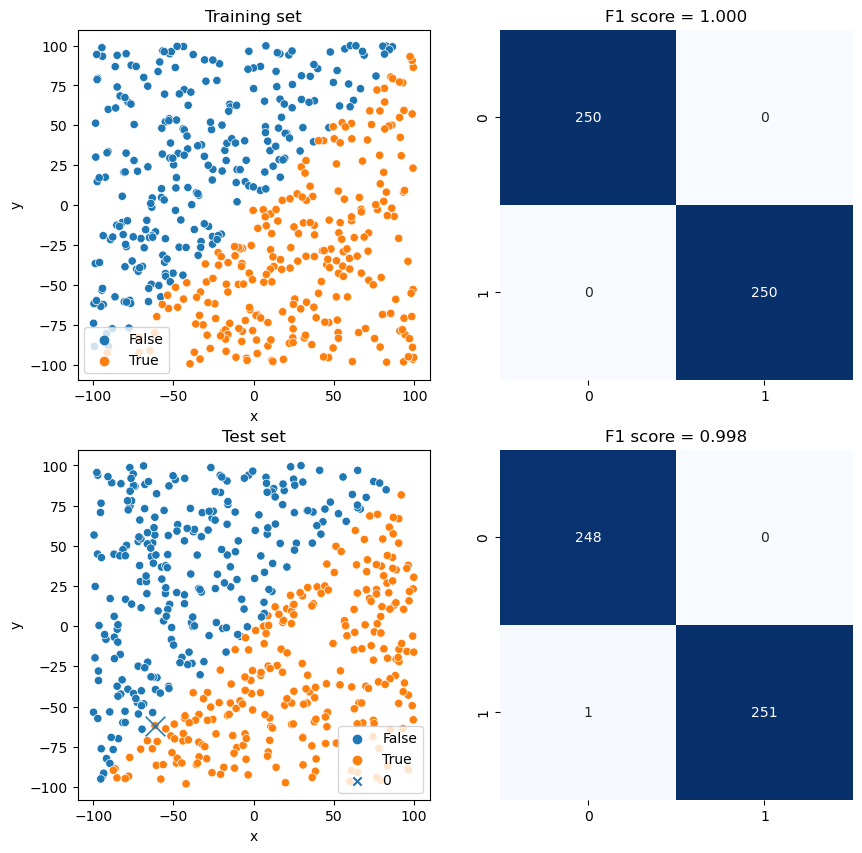

In [31]:
mlp = MLP(2,2,[100,100,100], classification = True, output_activation = linear)
times_linear, mse_linear, epochs_linear = mlp.fit(df_train[["x","y"]], df_train["c"], epochs=200, batch_size=100, learning_rate=0.001, shuffle=True, score_function=partial(f1_score,average="macro"),score_stop = 0.999)
plot_classification(mlp, df_train, df_test, some_error=True)

Text(0.5, 0.98, 'Comparison for different output activation functions')

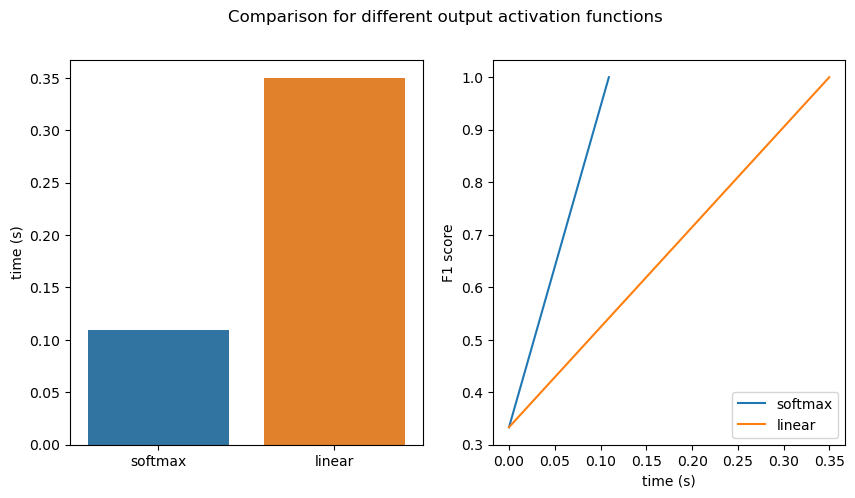

In [32]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))

labels = ["softmax","linear"]
axes[0] = sns.barplot(x=labels,y=[times[-1],times_linear[-1]], ax=axes[0])
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=times, y = mse, ax=axes[1], label="softmax")
axes[1] = sns.lineplot(x=times_linear, y = mse_linear, ax=axes[1], label="linear")
axes[1].set_xlabel("time (s)")
axes[1].set_ylabel("F1 score")
fig.suptitle("Comparison for different output activation functions")

#### xor3

In [33]:
df_train = pd.read_csv("data/classification/xor3-training.csv")
df_test = pd.read_csv("data/classification/xor3-test.csv")

Score 0.9919998719979519 reached  after 428 epochs .9799948786889444


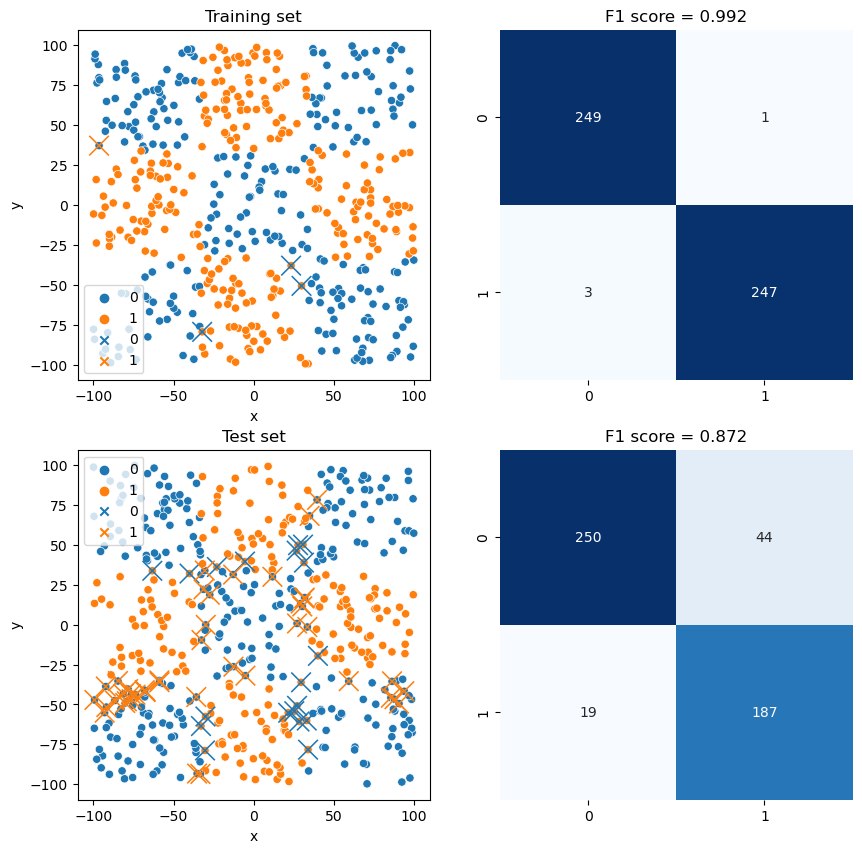

In [49]:
mlp = MLP(2,2,[100,100,100], classification = True)
times, mse, epochs = mlp.fit(df_train[["x","y"]], df_train["c"], epochs=5000, batch_size=200, learning_rate=0.005, shuffle=True, score_function=partial(f1_score,average="macro"),score_stop = 0.99)
plot_classification(mlp, df_train, df_test, some_error=True)

Score 0.992 reached  after 1522 epochs 933 ,Score: 0.9859994959818553


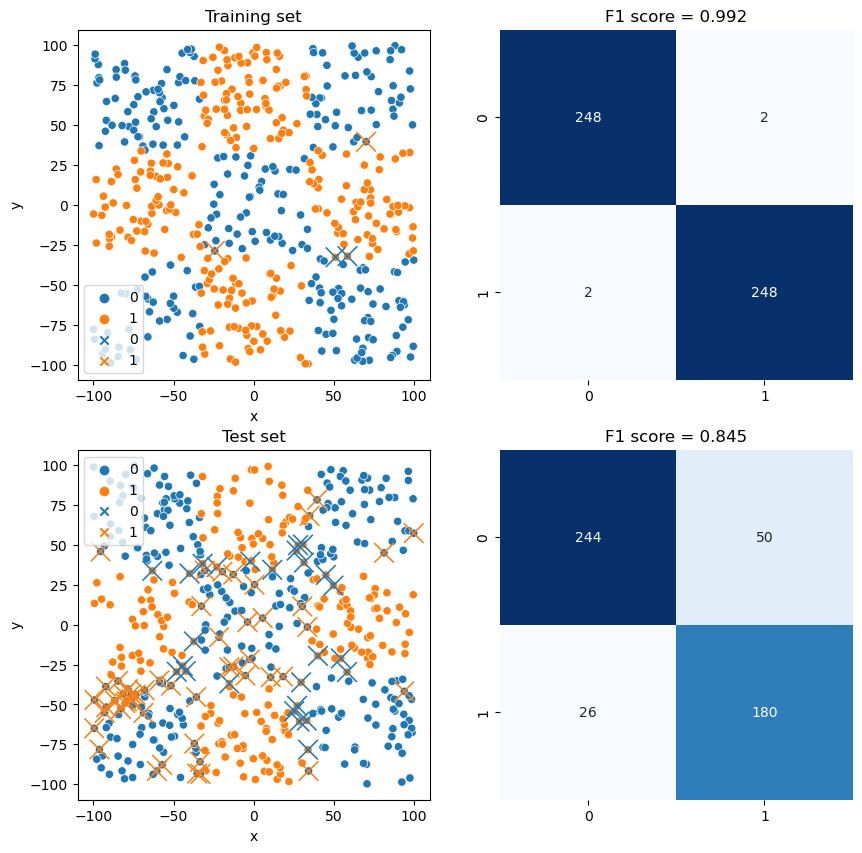

In [48]:
mlp = MLP(2,2,[100,100,100], classification = True, output_activation=linear)
times_linear, mse_linear, epochs_linear = mlp.fit(df_train[["x","y"]], df_train["c"], epochs=5000, batch_size=200, learning_rate=0.005, shuffle=True, score_function=partial(f1_score,average="macro"),score_stop = 0.99)
plot_classification(mlp, df_train, df_test, some_error=True)

Text(0.5, 0.98, 'Comparison for different output activation functions')

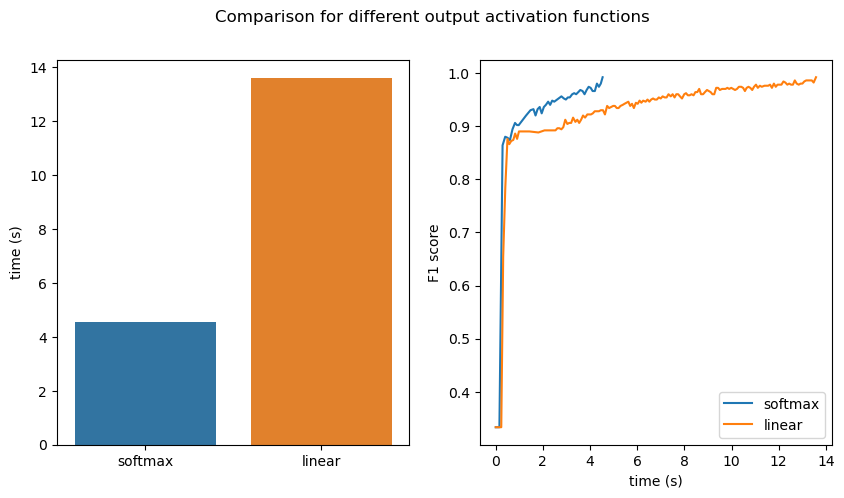

In [50]:
fig, axes = plt.subplots(1, 2, figsize=(10,5))

labels = ["softmax","linear"]
axes[0] = sns.barplot(x=labels,y=[times[-1],times_linear[-1]], ax=axes[0])
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=times, y = mse, ax=axes[1], label="softmax")
axes[1] = sns.lineplot(x=times_linear, y = mse_linear, ax=axes[1], label="linear")
axes[1].set_xlabel("time (s)")
axes[1].set_ylabel("F1 score")
fig.suptitle("Comparison for different output activation functions")

## LAB 5 - testowanie różnych funkcji aktywacji

Będę sprawdzać performance sieci w zależności od funkcji aktywacji na hidden layerach. Testowane funkcje to:
* sigmoid
* relu (leaky relu dla klasyfikacji)
* tanh
* linear

Będę również sprawdzał jak one sobie radzą w zależności od architektury sieci (liczba warstw i neuronów) na 4 różnych zbiorach. 2 zadania regresji i 2 zadania klasyfikacji.

#### multimodal-large

In [16]:
from MLP import *
df_train = pd.read_csv("data/regression/multimodal-large-training.csv")
df_test = pd.read_csv("data/regression/multimodal-large-test.csv")

Żeby test był sprawiedliwy szukałem dla każdej architektury odpowiednich parametrów przy uczeniu. Robiłem to na podstawie grid searcha.

In [1]:
# used in grid search
learning_rates = [0.1, 0.01, 0.001]
momentum_coefs = [0.2, 0.5, 0.9]
normalisation_coefs = [0.9, 0.99, 0.999]

In [35]:
coefs_search(df_train["x"], df_train["y"], layers_activation=sigmoid,input_dim=1, output_dim=1, hidden_dims=[33,33,33], classification=False,
            epochs=400, batch_size=500, learning_rates=learning_rates, momentum_coefs=momentum_coefs, normalisation_coefs=normalisation_coefs, score_stop=20)

Failure for learning_rate=0.1, momentum_coef=0.2, normalisation_coef=0.9
learning_rate=0.1, momentum_coef=0.2, normalisation_coef=0.99 |  loss = 5177.483441669661 time = 28.680302514999767
learning_rate=0.1, momentum_coef=0.2, normalisation_coef=0.999 |  loss = 5177.278374931367 time = 27.58778762799966
learning_rate=0.1, momentum_coef=0.5, normalisation_coef=0.9 |  loss = 9.154975204768292 time = 12.465816504000031
learning_rate=0.1, momentum_coef=0.5, normalisation_coef=0.99 |  loss = 5177.481273957572 time = 12.891003131999696
learning_rate=0.1, momentum_coef=0.5, normalisation_coef=0.999 |  loss = 5179.500255765762 time = 12.503062839999984
learning_rate=0.1, momentum_coef=0.9, normalisation_coef=0.9 |  loss = 296.2539686768108 time = 11.446263634999923
learning_rate=0.1, momentum_coef=0.9, normalisation_coef=0.99 |  loss = 1159.3834797153354 time = 11.098069395000039
learning_rate=0.1, momentum_coef=0.9, normalisation_coef=0.999 |  loss = 5178.750258052356 time = 25.57651906299997

Z grid searcha dostawałem potencjalnie dobre parametry i potem sprawdzałem czy ten wynik jest przypadkowy, czy powtarzalny:

In [19]:
coefs_search(df_train["x"], df_train["y"], layers_activation=sigmoid,input_dim=1, output_dim=1, hidden_dims=[33,33,33], classification=False,
            epochs=400, batch_size=500, learning_rates=[0.01,0.01,0.01], momentum_coefs=[0.9], normalisation_coefs=[0.99], score_stop=10)

learning_rate=0.01, momentum_coef=0.9, normalisation_coef=0.99 |  loss = 360.04929603910017 time = 40.695070071000146
learning_rate=0.01, momentum_coef=0.9, normalisation_coef=0.99 |  loss = 9.83644619839373 time = 6.741483089999974
learning_rate=0.01, momentum_coef=0.9, normalisation_coef=0.99 |  loss = 362.1328034445612 time = 6.555260004000047


Takie same kroki wykonywałem dla każdej architektury, dla każdego zbioru. Najlepsze wyniki brałem potem w poniższym benchmarku.
        

In [62]:
results_sigmoid , times_sigmoid, loss_sigmoid = benchmark_architecture(df_train["x"], df_train["y"], sample_size=5, layers_activation=sigmoid,
                                                                        input_dim=1, output_dim=1,all_hidden_dims=[[100],[50,50],[33,33,33]], classification=False,
                                                                        epochs=500, batch_size=500, learning_rates=[0.1,0.1,0.01], coefs=[[0.5,0.999],[0.9,0.9],[0.9,0.99]], score_stop=10)

In [63]:
results_sigmoid

,end_time_sigmoid_1x100,end_loss_sigmoid_1x100,end_time_sigmoid_2x50,end_loss_sigmoid_2x50,end_time_sigmoid_3x33,end_loss_sigmoid_3x33
0,11.825147,9.867992,20.738307,927.935005,10.455398,139.715432
1,12.807091,15.432795,21.327492,161.007805,11.871810,79.583576
2,19.201707,9.949156,8.155904,8.876416,9.268681,436.437881
3,9.718565,12.008961,7.266320,340.846013,4.725211,2293.396614
4,17.112582,9.942074,8.625645,355.395120,7.058659,2519.652180


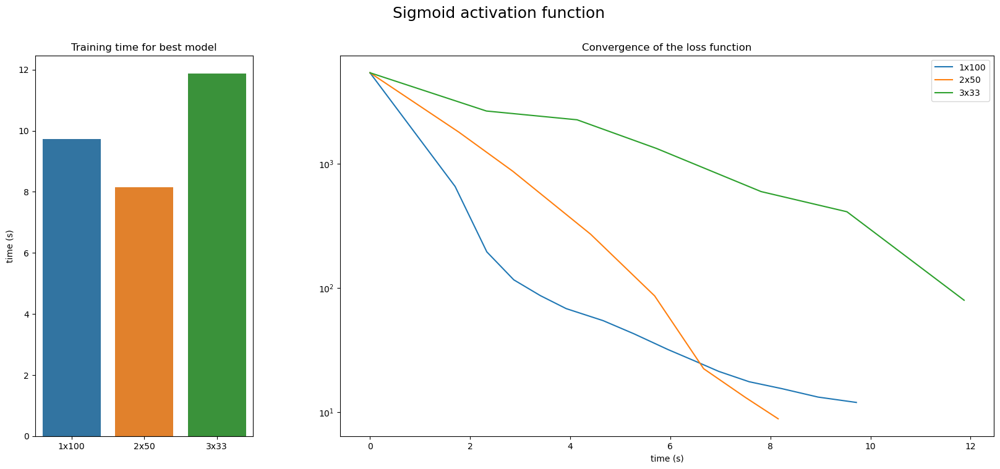

In [114]:

time_1x100 = times_sigmoid[3]
loss_1x100 = loss_sigmoid[3]
time_2x50 = times_sigmoid[7]
loss_2x50 = loss_sigmoid[7]
time_3x33 = times_sigmoid[11]
loss_3x33 = loss_sigmoid[11]

labels = ["1x100", "2x50", "3x33"]


fig, axes = plt.subplots(1, 2, width_ratios=[1, 3], figsize=(20,8))

axes[0] = sns.barplot(x=labels,y=[time_1x100[-1],time_2x50[-1],time_3x33[-1]], ax=axes[0])
axes[0].set_title("Training time for best model" )
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=time_1x100, y = loss_1x100, ax=axes[1], label="1x100")
axes[1] = sns.lineplot(x=time_2x50, y = loss_2x50, ax=axes[1], label="2x50")
axes[1] = sns.lineplot(x=time_3x33, y = loss_3x33, ax=axes[1], label="3x33")
axes[1].set_title("Convergence of the loss function")
axes[1].autoscale(enable=True)
axes[1].set_yscale("symlog")
axes[1].set_xlabel("time (s)")

fig.suptitle("Sigmoid activation function", fontsize=18)
plt.show()

In [70]:
results_relu , times_relu, loss_relu = benchmark_architecture(df_train["x"], df_train["y"], sample_size=5, layers_activation=relu,
                                                                input_dim=1, output_dim=1,all_hidden_dims=[[100],[50,50],[33,33,33]], classification=False,
                                                                epochs=500, batch_size=500, learning_rates=[0.1,0.01,0.1], coefs=[[0.9,0.999],[0.5,0.999],[0.9,0.9]], score_stop=9)

In [71]:
results_relu

,end_time_relu_1x100,end_loss_relu_1x100,end_time_relu_2x50,end_loss_relu_2x50,end_time_relu_3x33,end_loss_relu_3x33
0,33.398793,99.169971,30.610840,350.811725,4.808814,7.593938
1,43.715946,177.530693,31.158410,294.644319,4.396968,39.329515
2,32.300836,157.123434,26.598205,47.394678,4.370828,94.354483
3,32.156239,158.457755,31.468207,79.442575,4.466431,20.495781
4,20.198194,102.817734,31.006695,289.514820,4.731319,15.934182


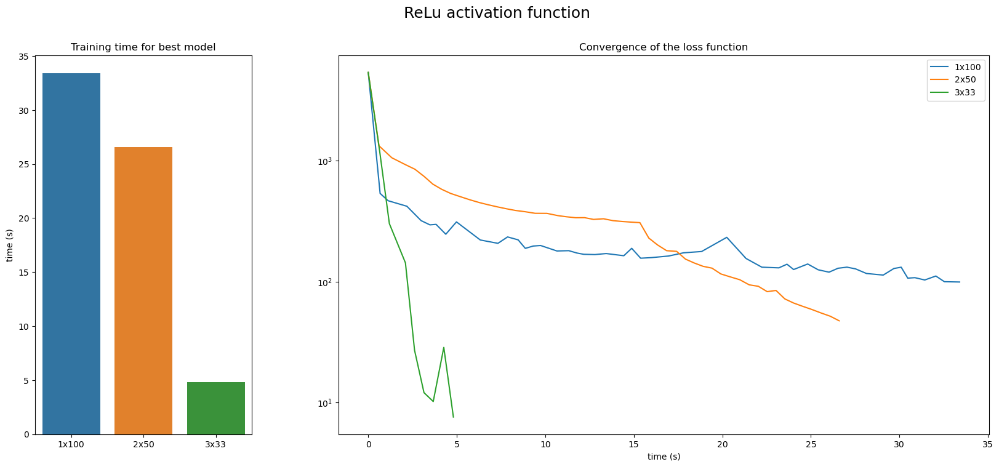

In [115]:

time_1x100 = times_relu[0]
loss_1x100 = loss_relu[0]
time_2x50 = times_relu[7]
loss_2x50 = loss_relu[7]
time_3x33 = times_relu[10]
loss_3x33 = loss_relu[10]

labels = ["1x100", "2x50", "3x33"]


fig, axes = plt.subplots(1, 2, width_ratios=[1, 3], figsize=(20,8))

axes[0] = sns.barplot(x=labels,y=[time_1x100[-1],time_2x50[-1],time_3x33[-1]], ax=axes[0])
axes[0].set_title("Training time for best model" )
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=time_1x100, y = loss_1x100, ax=axes[1], label="1x100")
axes[1] = sns.lineplot(x=time_2x50, y = loss_2x50, ax=axes[1], label="2x50")
axes[1] = sns.lineplot(x=time_3x33, y = loss_3x33, ax=axes[1], label="3x33")
axes[1].set_title("Convergence of the loss function")
axes[1].autoscale(enable=True)
axes[1].set_yscale("symlog")
axes[1].set_xlabel("time (s)")

fig.suptitle("ReLu activation function", fontsize=18)
plt.show()

In [105]:
results_tanh , times_tanh, loss_tanh = benchmark_architecture(df_train["x"], df_train["y"], sample_size=5, layers_activation=tanh,
                                                                input_dim=1, output_dim=1,all_hidden_dims=[[100],[50,50],[33,33,33]], classification=False,
                                                                epochs=1000, batch_size=500, learning_rates=[0.1,0.1,0.1], coefs=[[0.9,0.9],[0.9,0.99],[0.9,0.99]], score_stop=9)

In [106]:
results_tanh

,end_time_tanh_1x100,end_loss_tanh_1x100,end_time_tanh_2x50,end_loss_tanh_2x50,end_time_tanh_3x33,end_loss_tanh_3x33
0,89.284128,8.830943,78.285426,893.300748,39.264616,8.851059
1,78.035000,8.953375,84.276254,25.900632,13.127456,8.732190
2,74.849599,27.883312,93.893948,1374.571805,12.137993,24.798768
3,107.869544,35.475855,82.776051,1431.998432,12.802654,1085.795365
4,94.317148,13.915676,87.262970,352.208597,13.896037,551.560135


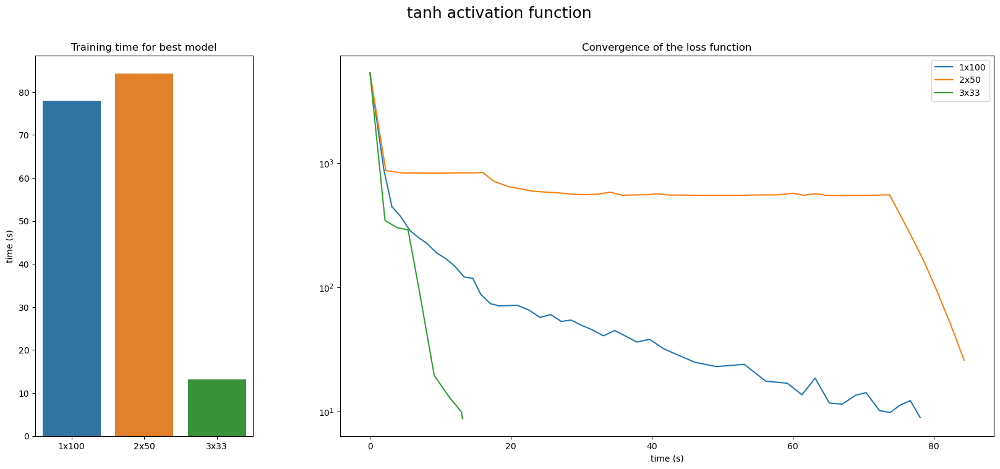

In [116]:
time_1x100 = times_tanh[1]
loss_1x100 = loss_tanh[1]
time_2x50 = times_tanh[6]
loss_2x50 = loss_tanh[6]
time_3x33 = times_tanh[11]
loss_3x33 = loss_tanh[11]

labels = ["1x100", "2x50", "3x33"]


fig, axes = plt.subplots(1, 2, width_ratios=[1, 3], figsize=(20,8))

axes[0] = sns.barplot(x=labels,y=[time_1x100[-1],time_2x50[-1],time_3x33[-1]], ax=axes[0])
axes[0].set_title("Training time for best model" )
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=time_1x100, y = loss_1x100, ax=axes[1], label="1x100")
axes[1] = sns.lineplot(x=time_2x50, y = loss_2x50, ax=axes[1], label="2x50")
axes[1] = sns.lineplot(x=time_3x33, y = loss_3x33, ax=axes[1], label="3x33")
axes[1].set_title("Convergence of the loss function")
axes[1].autoscale(enable=True)
axes[1].set_yscale("symlog")
axes[1].set_xlabel("time (s)")

fig.suptitle("tanh activation function", fontsize=18)
plt.show()

In [107]:
results_linear , times_linear, loss_linear = benchmark_architecture(df_train["x"], df_train["y"], sample_size=5, layers_activation=linear,
                                                                input_dim=1, output_dim=1,all_hidden_dims=[[100],[50,50],[33,33,33]], classification=False,
                                                                epochs=500, batch_size=500, learning_rates=[0.1,0.01,0.01], coefs=[[0.2,0.9],[0.2,0.99],[0.9,0.99]], score_stop=9)

In [108]:
results_linear

,end_time_linear_1x100,end_loss_linear_1x100,end_time_linear_2x50,end_loss_linear_2x50,end_time_linear_3x33,end_loss_linear_3x33
0,42.218023,4418.429408,56.166810,891.326482,37.462979,8.478906
1,35.720072,4398.571077,53.755040,296.787407,37.069819,360.219907
2,37.652437,4402.528937,50.673557,390.539400,12.346347,8.926132
3,36.766576,4398.839813,43.776690,891.145794,11.222015,1363.825827
4,34.577473,4401.191094,44.548317,1176.137983,11.896592,289.451773


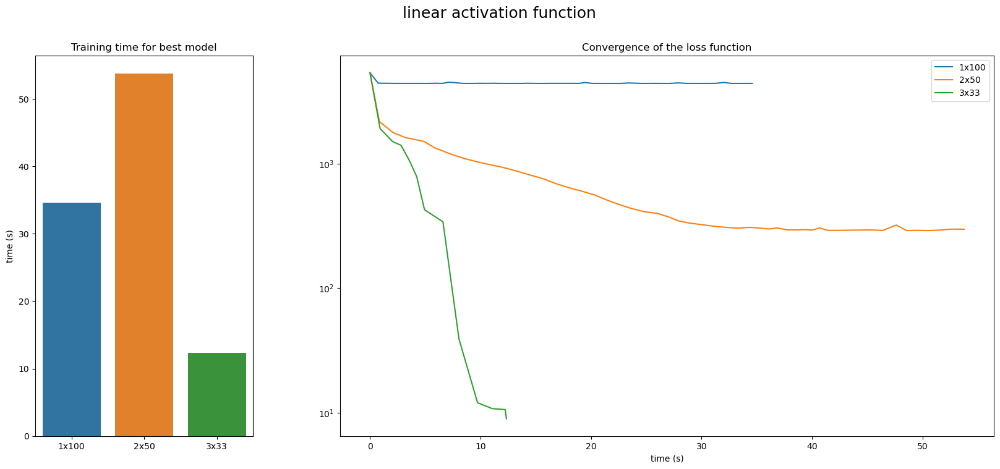

In [117]:
time_1x100 = times_linear[4]
loss_1x100 = loss_linear[4]
time_2x50 = times_linear[6]
loss_2x50 = loss_linear[6]
time_3x33 = times_linear[12]
loss_3x33 = loss_linear[12]

labels = ["1x100", "2x50", "3x33"]


fig, axes = plt.subplots(1, 2, width_ratios=[1, 3], figsize=(20,8))

axes[0] = sns.barplot(x=labels,y=[time_1x100[-1],time_2x50[-1],time_3x33[-1]], ax=axes[0])
axes[0].set_title("Training time for best model" )
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=time_1x100, y = loss_1x100, ax=axes[1], label="1x100")
axes[1] = sns.lineplot(x=time_2x50, y = loss_2x50, ax=axes[1], label="2x50")
axes[1] = sns.lineplot(x=time_3x33, y = loss_3x33, ax=axes[1], label="3x33")
axes[1].set_title("Convergence of the loss function")
axes[1].autoscale(enable=True)
axes[1].set_yscale("symlog")
axes[1].set_xlabel("time (s)")

fig.suptitle("linear activation function", fontsize=18)
plt.show()

Ogólnie wnioski są takie, że zwykle większa liczba warstw jest lepsza pod kilkoma względami. Dla kolejnych zbiorów będę korzystał tylko z funkcji sigmoid i relu.

#### steps-large

In [2]:
from MLP import *
df_train = pd.read_csv("data/regression/steps-large-training.csv",index_col=0)
df_test = pd.read_csv("data/regression/steps-large-test.csv", index_col=0)
learning_rates = [0.1,0.01,0.001]
normalisation_coefs = [0.9,0.99,0.999]
momentum_coefs = [0.2, 0.5, 0.9]

In [6]:
coefs_search(df_train["x"], df_train["y"], layers_activation=sigmoid,input_dim=1, output_dim=1, hidden_dims=[33,33,33], classification=False,
            epochs=300, batch_size=500, learning_rates=learning_rates, momentum_coefs=momentum_coefs, normalisation_coefs=normalisation_coefs, score_stop=1)

learning_rate=0.1, momentum_coef=0.2, normalisation_coef=0.9 |  loss = 27.213438924457655 time = 22.438243303000036
learning_rate=0.1, momentum_coef=0.2, normalisation_coef=0.99 |  loss = 35.93245412180917 time = 27.146002529000043
learning_rate=0.1, momentum_coef=0.2, normalisation_coef=0.999 |  loss = 6833.205848856002 time = 26.91836128099999
learning_rate=0.1, momentum_coef=0.5, normalisation_coef=0.9 |  loss = 27.893794926188335 time = 26.210952718000044
learning_rate=0.1, momentum_coef=0.5, normalisation_coef=0.99 |  loss = 21.015234077537905 time = 41.746611493000046
learning_rate=0.1, momentum_coef=0.5, normalisation_coef=0.999 |  loss = 6829.385602618862 time = 26.945495400000027
learning_rate=0.1, momentum_coef=0.9, normalisation_coef=0.9 |  loss = 29.344667298789915 time = 39.93657185200004
learning_rate=0.1, momentum_coef=0.9, normalisation_coef=0.99 |  loss = 83.39734706063541 time = 44.00829081100005
learning_rate=0.1, momentum_coef=0.9, normalisation_coef=0.999 |  loss =

In [15]:
coefs_search(df_train["x"], df_train["y"], layers_activation=relu,input_dim=1, output_dim=1, hidden_dims=[100], classification=False,
            epochs=500, batch_size=500, learning_rates=[0.1,0.1,0.1], momentum_coefs=[0.9], normalisation_coefs=[0.9], score_stop=1)

learning_rate=0.1, momentum_coef=0.9, normalisation_coef=0.9 |  loss = 51.838553454400774 time = 16.158236220000163
learning_rate=0.1, momentum_coef=0.9, normalisation_coef=0.9 |  loss = 55.831018953170314 time = 15.158541146999596
learning_rate=0.1, momentum_coef=0.9, normalisation_coef=0.9 |  loss = 51.88610108595359 time = 19.88874226500002


In [20]:
coefs_search(df_train["x"], df_train["y"], layers_activation=relu,input_dim=1, output_dim=1, hidden_dims=[100], classification=False,
            epochs=500, batch_size=500, learning_rates=[0.1,0.1,0.1], momentum_coefs=[0.9], normalisation_coefs=[0.999], score_stop=1)

learning_rate=0.1, momentum_coef=0.9, normalisation_coef=0.999 |  loss = 40.359929801245045 time = 28.766750875999605
learning_rate=0.1, momentum_coef=0.9, normalisation_coef=0.999 |  loss = 41.20007398869323 time = 25.122611902000244
learning_rate=0.1, momentum_coef=0.9, normalisation_coef=0.999 |  loss = 41.78929464508587 time = 22.509363643999677


In [21]:
results_sigmoid , times_sigmoid, loss_sigmoid = benchmark_architecture(df_train["x"], df_train["y"], sample_size=5, layers_activation=sigmoid,
                                                                        input_dim=1, output_dim=1,all_hidden_dims=[[100],[50,50],[33,33,33]], classification=False,
                                                                        epochs=500, batch_size=500, learning_rates=[0.1,0.05,0.01], coefs=[[0.9,0.999],[0.5,0.999],[0.2,0.999]], score_stop=3)

In [23]:
results_sigmoid

,end_time_sigmoid_1x100,end_loss_sigmoid_1x100,end_time_sigmoid_2x50,end_loss_sigmoid_2x50,end_time_sigmoid_3x33,end_loss_sigmoid_3x33
0,32.380769,35.501384,37.698201,19.462164,34.785651,18.628966
1,29.687219,32.986891,37.186206,14.899586,31.502197,12.728781
2,28.498368,34.564667,35.929019,10.858291,33.563587,22.508433
3,29.114707,35.889770,36.956995,17.856600,32.481038,21.240032
4,28.446495,34.432858,36.386657,22.226480,30.702522,12.242085


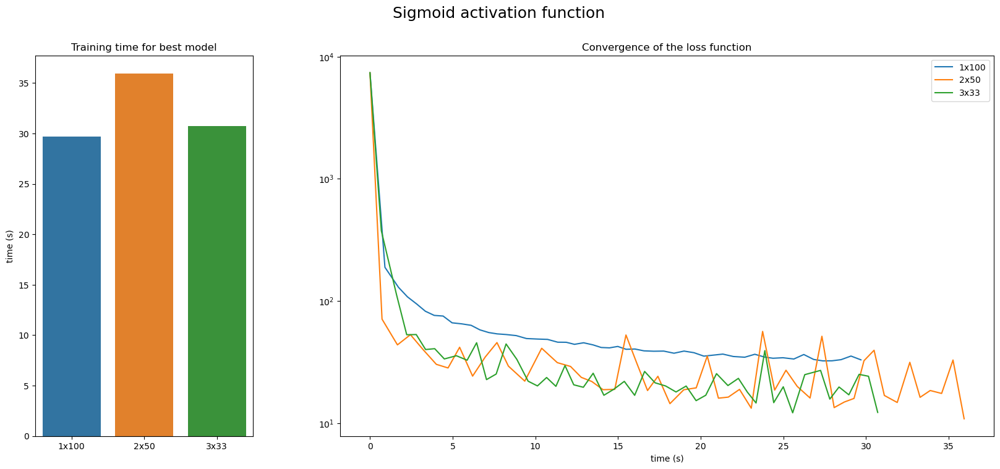

In [25]:

time_1x100 = times_sigmoid[1]
loss_1x100 = loss_sigmoid[1]
time_2x50 = times_sigmoid[7]
loss_2x50 = loss_sigmoid[7]
time_3x33 = times_sigmoid[14]
loss_3x33 = loss_sigmoid[14]

labels = ["1x100", "2x50", "3x33"]


fig, axes = plt.subplots(1, 2, width_ratios=[1, 3], figsize=(20,8))

axes[0] = sns.barplot(x=labels,y=[time_1x100[-1],time_2x50[-1],time_3x33[-1]], ax=axes[0])
axes[0].set_title("Training time for best model" )
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=time_1x100, y = loss_1x100, ax=axes[1], label="1x100")
axes[1] = sns.lineplot(x=time_2x50, y = loss_2x50, ax=axes[1], label="2x50")
axes[1] = sns.lineplot(x=time_3x33, y = loss_3x33, ax=axes[1], label="3x33")
axes[1].set_title("Convergence of the loss function")
axes[1].autoscale(enable=True)
axes[1].set_yscale("symlog")
axes[1].set_xlabel("time (s)")

fig.suptitle("Sigmoid activation function", fontsize=18)
plt.show()

In [ ]:
results_relu , times_relu, loss_relu = benchmark_architecture(df_train["x"], df_train["y"], sample_size=5, layers_activation=relu,
                                                                input_dim=1, output_dim=1,all_hidden_dims=[[100],[50,50],[33,33,33]], classification=False,
                                                                epochs=500, batch_size=500, learning_rates=[0.1,0.01,0.01], coefs=[[0.9,0.999],[0.2,0.99],[0.9,0.999]], score_stop=3)

In [24]:
results_relu

,end_time_relu_1x100,end_loss_relu_1x100,end_time_relu_2x50,end_loss_relu_2x50,end_time_relu_3x33,end_loss_relu_3x33
0,20.181327,149.470002,31.222716,17.777055,27.352899,6.359012
1,18.689897,41.783719,30.601867,33.673146,28.137777,6.691957
2,18.632475,73.923257,30.886622,18.253647,27.392818,9.675910
3,18.186791,33.992627,32.292585,31.258463,30.408586,7.261655
4,18.359307,37.447227,33.784728,11.006720,30.849224,10.601956


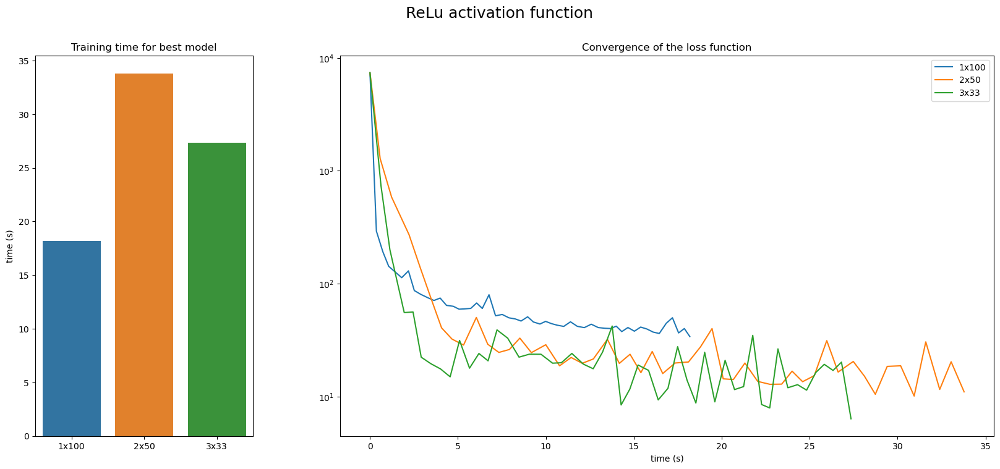

In [26]:

time_1x100 = times_relu[3]
loss_1x100 = loss_relu[3]
time_2x50 = times_relu[9]
loss_2x50 = loss_relu[9]
time_3x33 = times_relu[10]
loss_3x33 = loss_relu[10]

labels = ["1x100", "2x50", "3x33"]


fig, axes = plt.subplots(1, 2, width_ratios=[1, 3], figsize=(20,8))

axes[0] = sns.barplot(x=labels,y=[time_1x100[-1],time_2x50[-1],time_3x33[-1]], ax=axes[0])
axes[0].set_title("Training time for best model" )
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=time_1x100, y = loss_1x100, ax=axes[1], label="1x100")
axes[1] = sns.lineplot(x=time_2x50, y = loss_2x50, ax=axes[1], label="2x50")
axes[1] = sns.lineplot(x=time_3x33, y = loss_3x33, ax=axes[1], label="3x33")
axes[1].set_title("Convergence of the loss function")
axes[1].autoscale(enable=True)
axes[1].set_yscale("symlog")
axes[1].set_xlabel("time (s)")

fig.suptitle("ReLu activation function", fontsize=18)
plt.show()

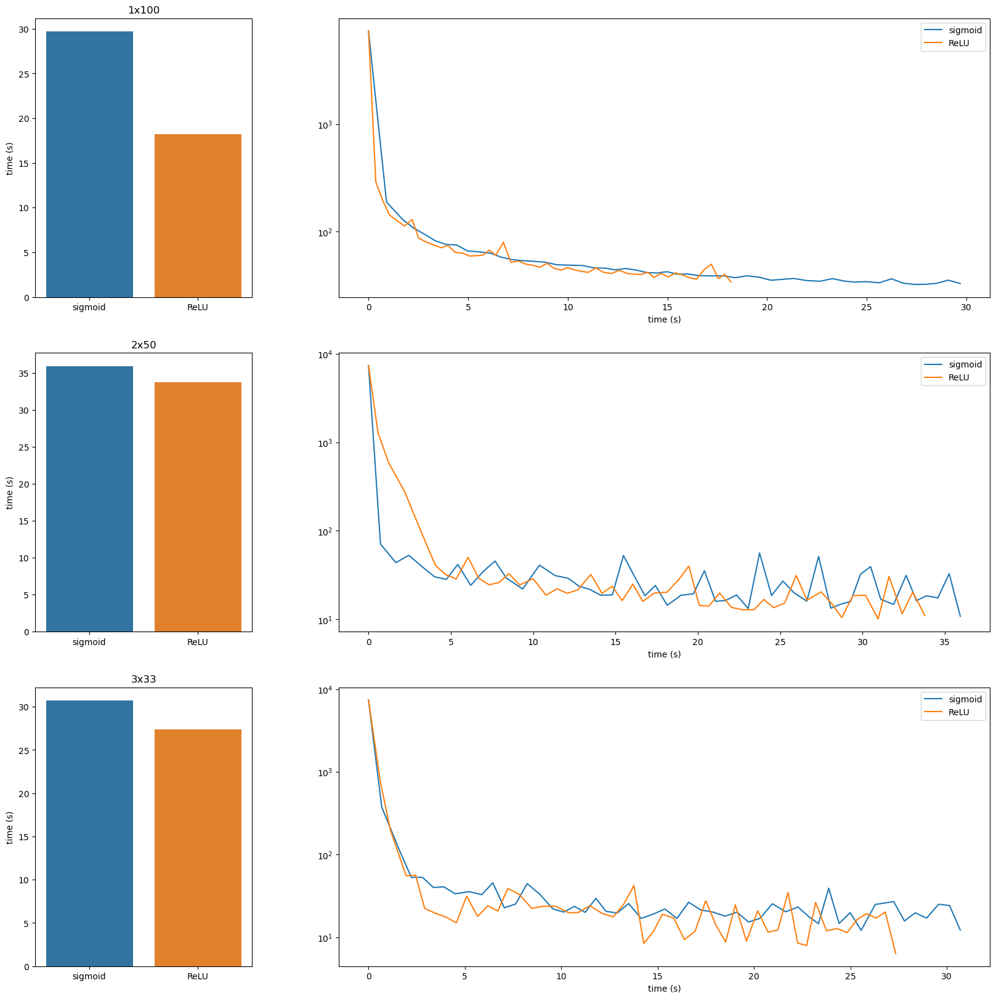

In [41]:

time_1x100s = times_sigmoid[1]
loss_1x100s = loss_sigmoid[1]
time_2x50s = times_sigmoid[7]
loss_2x50s = loss_sigmoid[7]
time_3x33s = times_sigmoid[14]
loss_3x33s = loss_sigmoid[14]


time_1x100r = times_relu[3]
loss_1x100r = loss_relu[3]
time_2x50r = times_relu[9]
loss_2x50r = loss_relu[9]
time_3x33r = times_relu[10]
loss_3x33r = loss_relu[10]

labels = ["sigmoid", "ReLU"]


fig, axes = plt.subplots(3, 2, width_ratios=[1,3], figsize=(20,20))

axes[0,0] = sns.barplot(x=labels,y=[time_1x100s[-1],time_1x100r[-1]], ax=axes[0,0])
axes[0,0].set_title("1x100" )
axes[0,0].set_ylabel("time (s)")


axes[1,0] = sns.barplot(x=labels,y=[time_2x50s[-1],time_2x50r[-1]], ax=axes[1,0])
axes[1,0].set_title("2x50" )
axes[1,0].set_ylabel("time (s)")


axes[2,0] = sns.barplot(x=labels,y=[time_3x33s[-1],time_3x33r[-1]], ax=axes[2,0])
axes[2,0].set_title("3x33" )
axes[2,0].set_ylabel("time (s)")


axes[0,1] = sns.lineplot(x=time_1x100s, y = loss_1x100s, ax=axes[0,1], label=labels[0])
axes[0,1] = sns.lineplot(x=time_1x100r, y = loss_1x100r, ax=axes[0,1], label=labels[1])
axes[0,1].autoscale(enable=True)
axes[0,1].set_yscale("symlog")
axes[0,1].set_xlabel("time (s)")


axes[1,1] = sns.lineplot(x=time_2x50s, y = loss_2x50s, ax=axes[1,1], label=labels[0])
axes[1,1] = sns.lineplot(x=time_2x50r, y = loss_2x50r, ax=axes[1,1], label=labels[1])
axes[1,1].autoscale(enable=True)
axes[1,1].set_yscale("symlog")
axes[1,1].set_xlabel("time (s)")


axes[2,1] = sns.lineplot(x=time_3x33s, y = loss_3x33s, ax=axes[2,1], label=labels[0])
axes[2,1] = sns.lineplot(x=time_3x33r, y = loss_3x33r, ax=axes[2,1], label=labels[1])
axes[2,1].autoscale(enable=True)
axes[2,1].set_yscale("symlog")
axes[2,1].set_xlabel("time (s)")

plt.show()

Wygląda jakby w tym przypadku relu i sigmoid działały bardzo podobnie, przy czym relu zwykle dawał lepsze/szybsze wyniki.

#### rings5-regular

In [1]:
from MLP import *
df_train = pd.read_csv("data/classification/rings5-regular-training.csv")
df_test = pd.read_csv("data/classification/rings5-regular-test.csv")
learning_rates = [0.01,0.005,0.001]

Poniżej zostawiam wynik z próby trenowania do klasyfikacji sieci o 2 inputach i jednej warstwie ukrytej. Widać, że nie ma naprawdę dobrych modeli. Wyniki sieci o jednej warstwie są bardzo słabe więc nie będę ich porównywał do reszty.

In [12]:
coefs_search(df_train[["x","y"]], df_train["c"], layers_activation=sigmoid,input_dim=2, output_dim=5, hidden_dims=[150], classification=True,
            epochs=2000, batch_size=100, learning_rates=[0.0001,0.00005],  score_stop=0.95, score_function=partial(f1_score, average="macro"))

learning_rate=0.0001, momentum_coef=0.2, normalisation_coef=0.9 |  loss = 0.7364088992463547 time = 58.601373176999914
learning_rate=0.0001, momentum_coef=0.2, normalisation_coef=0.99 |  loss = 0.7640574890361467 time = 49.379897738999716
learning_rate=0.0001, momentum_coef=0.2, normalisation_coef=0.999 |  loss = 0.7916520607040083 time = 47.61626312499902
learning_rate=0.0001, momentum_coef=0.5, normalisation_coef=0.9 |  loss = 0.7722108372245832 time = 48.31273836499895
learning_rate=0.0001, momentum_coef=0.5, normalisation_coef=0.99 |  loss = 0.7717308586463913 time = 47.26980767999885
learning_rate=0.0001, momentum_coef=0.5, normalisation_coef=0.999 |  loss = 0.8001750398282989 time = 36.608410939999885
learning_rate=0.0001, momentum_coef=0.9, normalisation_coef=0.9 |  loss = 0.7500722285196695 time = 37.19857070800026
learning_rate=0.0001, momentum_coef=0.9, normalisation_coef=0.99 |  loss = 0.7930566541744432 time = 37.961512519999815
learning_rate=0.0001, momentum_coef=0.9, norm

A dla dwóch warstw jest już lepiej

In [16]:
coefs_search(df_train[["x","y"]], df_train["c"], layers_activation=sigmoid,input_dim=2, output_dim=5, hidden_dims=[75,75], classification=True,
            epochs=2000, batch_size=100, learning_rates=learning_rates,  score_stop=0.95, score_function=partial(f1_score, average="macro"))

Failure for learning_rate=0.01, momentum_coef=0.2, normalisation_coef=0.9
Failure for learning_rate=0.01, momentum_coef=0.2, normalisation_coef=0.99
Failure for learning_rate=0.01, momentum_coef=0.2, normalisation_coef=0.999
Failure for learning_rate=0.01, momentum_coef=0.5, normalisation_coef=0.9
learning_rate=0.01, momentum_coef=0.5, normalisation_coef=0.99 |  loss = 0.9537661886663541 time = 1.1632765970007313
learning_rate=0.01, momentum_coef=0.5, normalisation_coef=0.999 |  loss = 0.8410631959758831 time = 1.7405806629994913
learning_rate=0.01, momentum_coef=0.9, normalisation_coef=0.9 |  loss = 0.8483938113858182 time = 1.3595290039993415
learning_rate=0.01, momentum_coef=0.9, normalisation_coef=0.99 |  loss = 0.9016318214934328 time = 1.6008873150003637
Failure for learning_rate=0.01, momentum_coef=0.9, normalisation_coef=0.999
learning_rate=0.005, momentum_coef=0.2, normalisation_coef=0.9 |  loss = 0.8347756698054122 time = 1.68997404899892
learning_rate=0.005, momentum_coef=0.

In [14]:
coefs_search(df_train[["x","y"]], df_train["c"], layers_activation=sigmoid,input_dim=2, output_dim=5, hidden_dims=[75,75], classification=True,
            epochs=2000, batch_size=100, learning_rates=[0.005,0.005,0.005],momentum_coefs=[0.9], normalisation_coefs=[0.999],  score_stop=0.95, score_function=partial(f1_score, average="macro"))

learning_rate=0.005, momentum_coef=0.9, normalisation_coef=0.999 |  loss = 0.9561415529325693 time = 4.240906315999382
learning_rate=0.005, momentum_coef=0.9, normalisation_coef=0.999 |  loss = 0.9513490180016735 time = 5.016446818000986
learning_rate=0.005, momentum_coef=0.9, normalisation_coef=0.999 |  loss = 0.9309245197950455 time = 1.9286320770006569


In [7]:
results_sigmoid , times_sigmoid, loss_sigmoid = benchmark_architecture(df_train[["x","y"]], df_train["c"], sample_size=5, layers_activation=sigmoid, score_function=partial(f1_score, average="macro"),
                                                                        input_dim=2, output_dim=5,all_hidden_dims=[[150],[75,75],[50,50,50]], classification=True,
                                                                        epochs=2000, batch_size=100, learning_rates=[0.0001,0.005,0.005], coefs=[[0.5,0.999],[0.9,0.999],[0.9,0.999]], score_stop=0.95)

In [8]:
results_sigmoid

,end_time_sigmoid_1x150,end_loss_sigmoid_1x150,end_time_sigmoid_2x75,end_loss_sigmoid_2x75,end_time_sigmoid_3x50,end_loss_sigmoid_3x50
0,47.991004,0.771361,1.122983,0.954223,1.038352,0.963781
1,38.169843,0.817658,1.400756,0.936352,1.279102,0.956732
2,37.897271,0.779390,1.140268,0.950927,0.944157,0.900345
3,38.312103,0.795387,1.078772,0.876132,1.129465,0.932241
4,40.524927,0.783068,1.227329,0.940534,1.063308,0.960221


In [10]:
warnings.filterwarnings("ignore")
results_relu , times_relu, loss_relu = benchmark_architecture(df_train[["x","y"]], df_train["c"], sample_size=5, layers_activation=leaky_relu,
                                                                input_dim=2, output_dim=5,all_hidden_dims=[[75,75],[50,50,50]], classification=True,
                                                                epochs=1000, batch_size=100, learning_rates=[0.001,0.001], coefs=[[0.9,0.99],[0.9,0.999]], score_stop=0.95, score_function=partial(f1_score, average="macro"))

In [11]:
results_relu

,end_time_leaky_relu_2x75,end_loss_leaky_relu_2x75,end_time_leaky_relu_3x50,end_loss_leaky_relu_3x50
0,12.750076,0.954327,4.601948,0.950163
1,9.470888,0.951234,4.515912,0.923502
2,10.009147,0.953271,4.526013,0.931080
3,5.859474,0.955101,4.511198,0.897637
4,5.892652,0.863601,3.907206,0.955124


Text(0.5, 0, 'time (s)')

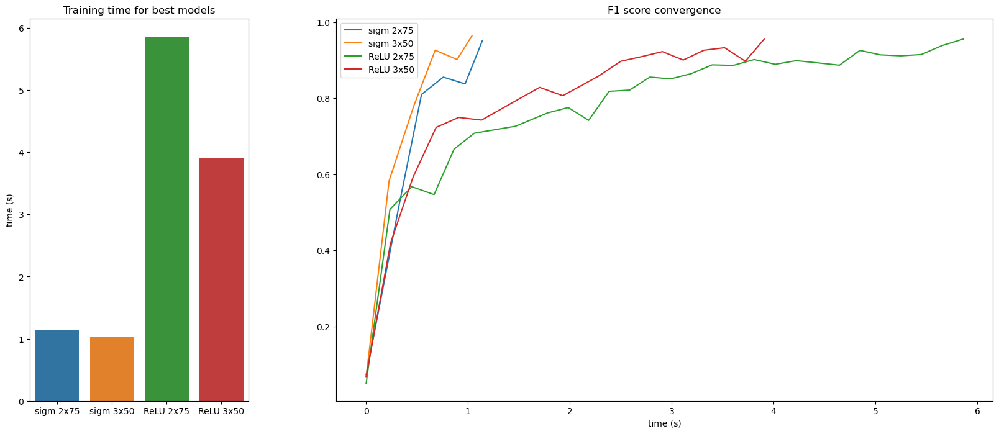

In [29]:
time_2x50s = times_sigmoid[7]
loss_2x50s = loss_sigmoid[7]
time_3x33s = times_sigmoid[10]
loss_3x33s = loss_sigmoid[10]



time_2x50r = times_relu[3]
loss_2x50r = loss_relu[3]
time_3x33r = times_relu[9]
loss_3x33r = loss_relu[9]

labels = ["sigm 2x75","sigm 3x50", "ReLU 2x75", "ReLU 3x50"]


fig, axes = plt.subplots(1, 2, width_ratios=[1, 3], figsize=(20,8))

axes[0] = sns.barplot(x=labels,y=[time_2x50s[-1],time_3x33s[-1], time_2x50r[-1],time_3x33r[-1] ], ax=axes[0])
axes[0].set_title("Training time for best models" )
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=time_2x50s, y = loss_2x50s, ax=axes[1], label=labels[0])
axes[1] = sns.lineplot(x=time_3x33s, y = loss_3x33s, ax=axes[1], label=labels[1])
axes[1] = sns.lineplot(x=time_2x50r, y = loss_2x50r, ax=axes[1], label=labels[2])
axes[1] = sns.lineplot(x=time_3x33r, y = loss_3x33r, ax=axes[1], label=labels[3])
axes[1].set_title("F1 score convergence")
axes[1].autoscale(enable=True)
axes[1].set_xlabel("time (s)")




#### rings3-regular

In [1]:
from MLP import *
df_train = pd.read_csv("data/classification/rings3-regular-training.csv")
df_test = pd.read_csv("data/classification/rings3-regular-test.csv")
learning_rates = [0.01,0.005,0.001]

Nie będę porównywał modeli z jedną warstwą bo są po prostu słabe, przykłady dla sigmoid i relu pod spodem. Ogólnie nie da się zrobić dobrego modelu w tej klasyfikacji na jednej warstwie. Często w trakcie liczenia modele się wywalają. Nigdy nie przekroczyły f1 > 0.8. Zawsze bardzo długo się fitują.

In [ ]:
coefs_search(df_train[["x","y"]], df_train["c"], layers_activation=leaky_relu,input_dim=2, output_dim=3, hidden_dims=[150], classification=True,
            epochs=1000, batch_size=100, learning_rates=[0.00005],momentum_coefs=[0.9], normalisation_coefs=[0.999],  score_stop=0.95, score_function=partial(f1_score, average="macro"), allow_warnings=True)

learning_rate=5e-05, momentum_coef=0.9, normalisation_coef=0.999 |  loss = 0.6730130552613547 time = 48.195965276999914


In [ ]:
coefs_search(df_train[["x","y"]], df_train["c"], layers_activation=sigmoid,input_dim=2, output_dim=3, hidden_dims=[150], classification=True,
            epochs=1000, batch_size=100,  learning_rates=[0.00005],momentum_coefs=[0.9], normalisation_coefs=[0.999],  score_stop=0.95, score_function=partial(f1_score, average="macro"))

learning_rate=5e-05, momentum_coef=0.9, normalisation_coef=0.999 |  loss = 0.6576397645404427 time = 35.08574609099992


In [5]:
results_sigmoid , times_sigmoid, loss_sigmoid = benchmark_architecture(df_train[["x","y"]], df_train["c"], sample_size=5, layers_activation=sigmoid, score_function=partial(f1_score, average="macro"),
                                                                        input_dim=2, output_dim=3,all_hidden_dims=[[75,75],[50,50,50]], classification=True,
                                                                        epochs=2000, batch_size=100, learning_rates=[0.005,0.005], coefs=[[0.9,0.999],[0.9,0.999]], score_stop=0.95)

In [6]:
results_sigmoid

,end_time_sigmoid_2x75,end_loss_sigmoid_2x75,end_time_sigmoid_3x50,end_loss_sigmoid_3x50
0,3.612395,0.955988,1.840941,0.890402
1,3.372325,0.954651,1.457062,0.894056
2,2.999028,0.930562,1.985195,0.915714
3,2.524156,0.932215,4.876324,0.950684
4,2.087658,0.953918,3.116700,0.851935


In [8]:
warnings.filterwarnings("ignore")
results_relu , times_relu, loss_relu = benchmark_architecture(df_train[["x","y"]], df_train["c"], sample_size=5, layers_activation=leaky_relu,
                                                                input_dim=2, output_dim=3,all_hidden_dims=[[75,75],[50,50,50]], classification=True,
                                                                epochs=2000, batch_size=100, learning_rates=[0.001,0.001], coefs=[[0.2,0.999],[0.9,0.99]], score_stop=0.95, score_function=partial(f1_score, average="macro"))

In [9]:
results_relu

,end_time_leaky_relu_2x75,end_loss_leaky_relu_2x75,end_time_leaky_relu_3x50,end_loss_leaky_relu_3x50
0,14.732683,0.954000,13.615262,0.923558
1,14.068867,0.950577,8.824941,0.958820
2,15.599204,0.874068,7.663957,0.953334
3,15.639917,0.933719,8.344489,0.935454
4,12.515588,0.955551,11.847713,0.950460


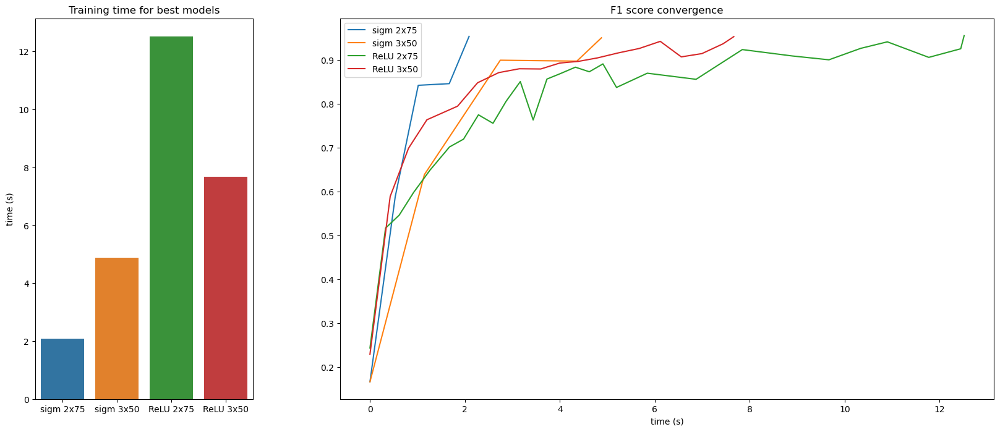

In [11]:
time_2x50s = times_sigmoid[4]
loss_2x50s = loss_sigmoid[4]
time_3x33s = times_sigmoid[8]
loss_3x33s = loss_sigmoid[8]



time_2x50r = times_relu[4]
loss_2x50r = loss_relu[4]
time_3x33r = times_relu[7]
loss_3x33r = loss_relu[7]

labels = ["sigm 2x75","sigm 3x50", "ReLU 2x75", "ReLU 3x50"]


fig, axes = plt.subplots(1, 2, width_ratios=[1, 3], figsize=(20,8))

axes[0] = sns.barplot(x=labels,y=[time_2x50s[-1],time_3x33s[-1], time_2x50r[-1],time_3x33r[-1] ], ax=axes[0])
axes[0].set_title("Training time for best models" )
axes[0].set_ylabel("time (s)")

axes[1] = sns.lineplot(x=time_2x50s, y = loss_2x50s, ax=axes[1], label=labels[0])
axes[1] = sns.lineplot(x=time_3x33s, y = loss_3x33s, ax=axes[1], label=labels[1])
axes[1] = sns.lineplot(x=time_2x50r, y = loss_2x50r, ax=axes[1], label=labels[2])
axes[1] = sns.lineplot(x=time_3x33r, y = loss_3x33r, ax=axes[1], label=labels[3])
axes[1].set_title("F1 score convergence")
axes[1].autoscale(enable=True)
axes[1].set_xlabel("time (s)")
plt.show()



Bardzo podobne wyniki do poprzedniego zbioru.

## LAB 6 -  Zjawisko przeuczenia + regularyzacja

In [1]:
from MLP import *
df_train = pd.read_csv("data/regression/multimodal-sparse-training.csv")
df_test = pd.read_csv("data/regression/multimodal-sparse-test.csv")

In [2]:
df_train.tail()

,x,y
35,-0.291020,21.088507
36,-0.170612,45.785709
37,-0.615842,-75.978182
38,0.799539,91.252917
39,0.720699,30.526198


In [3]:
# base mlp
mlp = MLP(input_dim=1,output_dim=1,hidden_dims=[100],classification=False)
times_base, loss_base, epochs_base, best_loss_base, best_model_base = mlp.fit(df_train["x"],df_train["y"],epochs=10000,learning_rate=0.01,verbose=True,shuffle=True,batch_size=-1)

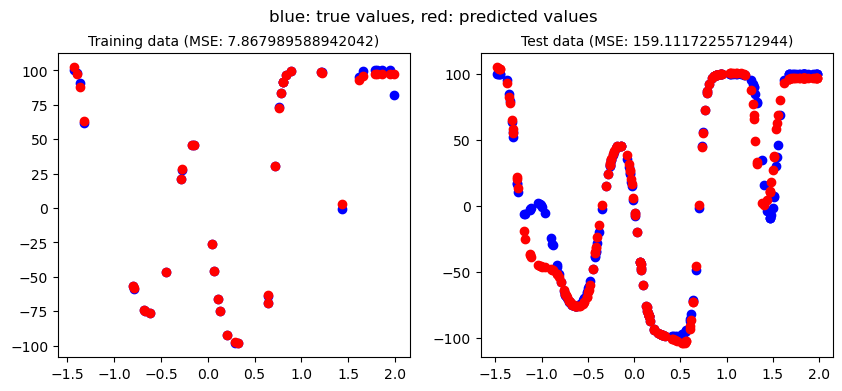

In [8]:
plot_predictions(best_model_base,df_train,df_test)

In [168]:
# model with regularization
mlp = MLP(input_dim=1,output_dim=1,hidden_dims=[100],classification=False)
times_reg, loss_reg, epochs_reg, best_loss_reg, best_model_reg = mlp.fit(df_train["x"],df_train["y"],epochs=100000,learning_rate=0.03,verbose=True,shuffle=True,batch_size=-1,regularisation_coef=0.06)

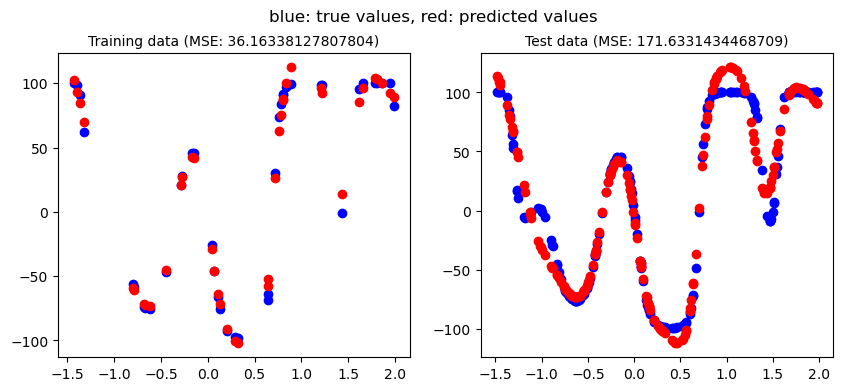

In [169]:
plot_predictions(best_model_reg,df_train,df_test)

In [18]:
# model with dropout
mlp = MLP(input_dim=1,output_dim=1,hidden_dims=[100],classification=False)
times_val, loss_val, epochs_val, best_loss_val, best_model_val = mlp.fit(df_train["x"],df_train["y"],epochs=20000,learning_rate=0.01,verbose=True,shuffle=True,batch_size=-1,validation_split=0.3,val_patience=100)

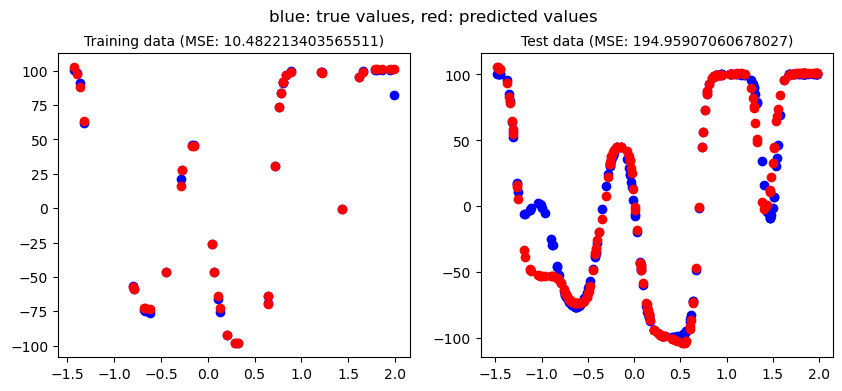

In [19]:
plot_predictions(best_model_val,df_train,df_test)

In [165]:
# model with regularization and dropout
mlp = MLP(input_dim=1,output_dim=1,hidden_dims=[100],classification=False)
times_regval, loss_regval, epochs_regval, best_loss_regval, best_model_regval = mlp.fit(df_train["x"],df_train["y"],epochs=100000,learning_rate=0.04,verbose=True,shuffle=True,batch_size=-1,regularisation_coef=0.08, validation_split=0.2, val_patience=2000)

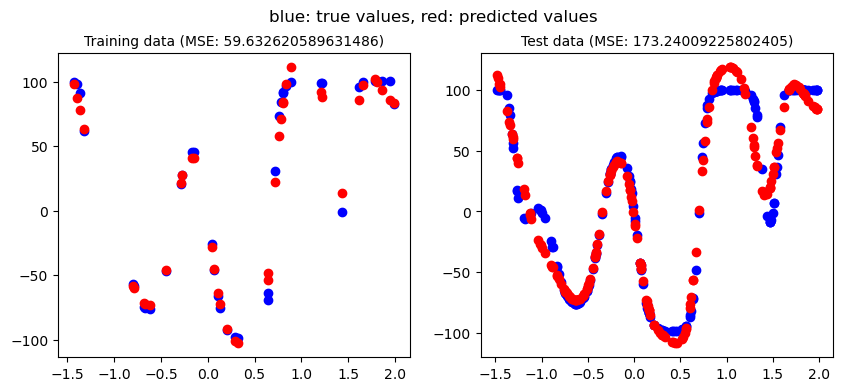

In [117]:
plot_predictions(best_model_regval,df_train,df_test)

#### rings5-sparse

In [170]:
from MLP import *
df_train = pd.read_csv("data/classification/rings5-sparse-training.csv")
df_test = pd.read_csv("data/classification/rings5-sparse-test.csv")
df_train.shape

(200, 3)

In [2]:
warnings.filterwarnings("ignore")
mlp = MLP(input_dim=2,output_dim=5,hidden_dims=[30,30,30],classification=True, layers_activation=leaky_relu)
times_base, loss_base, epochs_base, best_loss_base, best_model_base = mlp.fit(df_train[["x","y"]],df_train["c"],epochs=5000,learning_rate=0.0005,shuffle=True,batch_size=16,score_function=partial(f1_score,average="macro"),score_stop=0.99,)
warnings.filterwarnings("default")

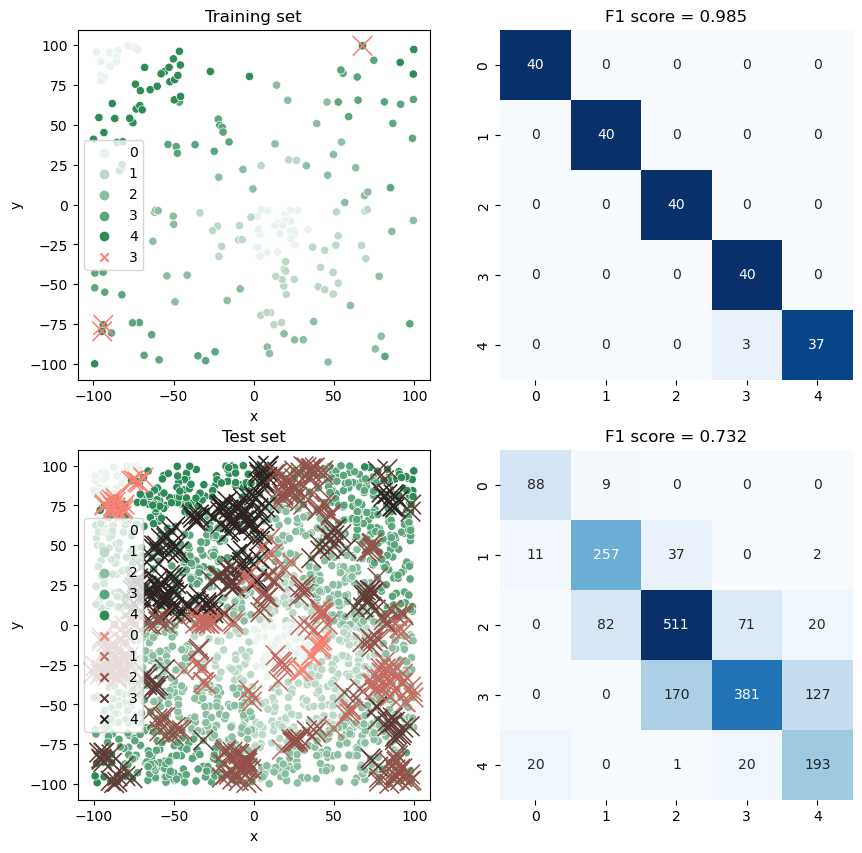

In [4]:
warnings.filterwarnings("ignore")
plot_classification(best_model_base,df_train,df_test)
warnings.filterwarnings("default")

In [5]:
warnings.filterwarnings("ignore")
mlp = MLP(input_dim=2,output_dim=5,hidden_dims=[30,30,30],classification=True, layers_activation=leaky_relu)
times_reg, loss_reg, epochs_reg, best_loss_reg, best_model_reg = mlp.fit(df_train[["x","y"]],df_train["c"],epochs=5000,learning_rate=0.0005,regularisation_coef=0.1,shuffle=True,batch_size=16,score_function=partial(f1_score,average="macro"),score_stop=0.99)
warnings.filterwarnings("default")

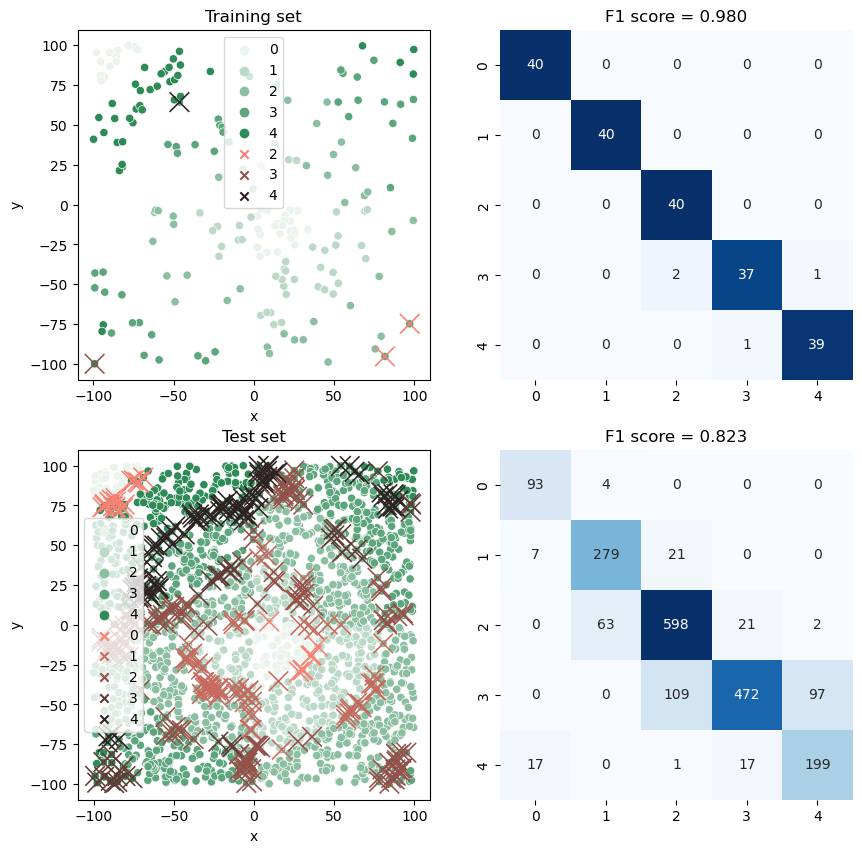

In [7]:
warnings.filterwarnings("ignore")
plot_classification(best_model_reg,df_train,df_test)
warnings.filterwarnings("default")

In [8]:
warnings.filterwarnings("ignore")
mlp = MLP(input_dim=2,output_dim=5,hidden_dims=[30,30,30],classification=True, layers_activation=leaky_relu)
times_val, loss_val, epochs_val, best_loss_val, best_model_val = mlp.fit(df_train[["x","y"]],df_train["c"],epochs=5000,learning_rate=0.0005,validation_split=0.2,val_patience=600,shuffle=True,batch_size=16,score_function=partial(f1_score,average="macro"),score_stop=0.99)
warnings.filterwarnings("default")

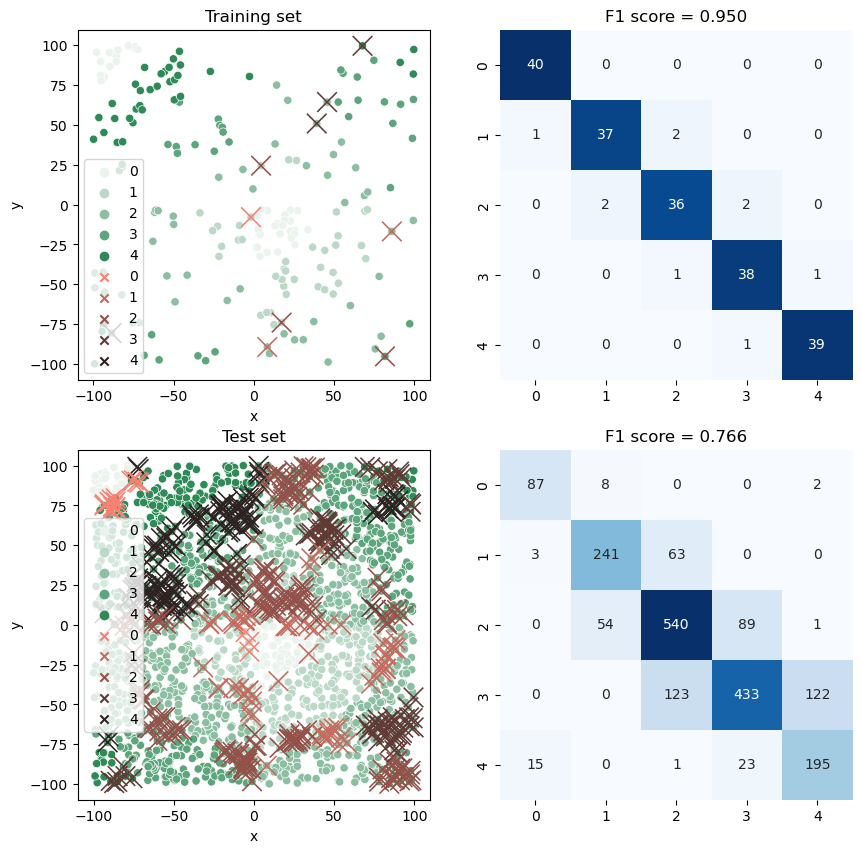

In [30]:
warnings.filterwarnings("ignore")
plot_classification(best_model_val,df_train,df_test)
warnings.filterwarnings("default")

In [25]:
warnings.filterwarnings("ignore")
mlp = MLP(input_dim=2,output_dim=5,hidden_dims=[30,30,30],classification=True, layers_activation=leaky_relu)
times_regval, loss_regval, epochs_regval, best_loss_regval, best_model_regnal = mlp.fit(df_train[["x","y"]],df_train["c"],epochs=5000,learning_rate=0.0005,regularisation_coef=0.5,validation_split=0.2,val_patience=600,shuffle=True,batch_size=16,score_function=partial(f1_score,average="macro"),score_stop=0.99)
warnings.filterwarnings("default")

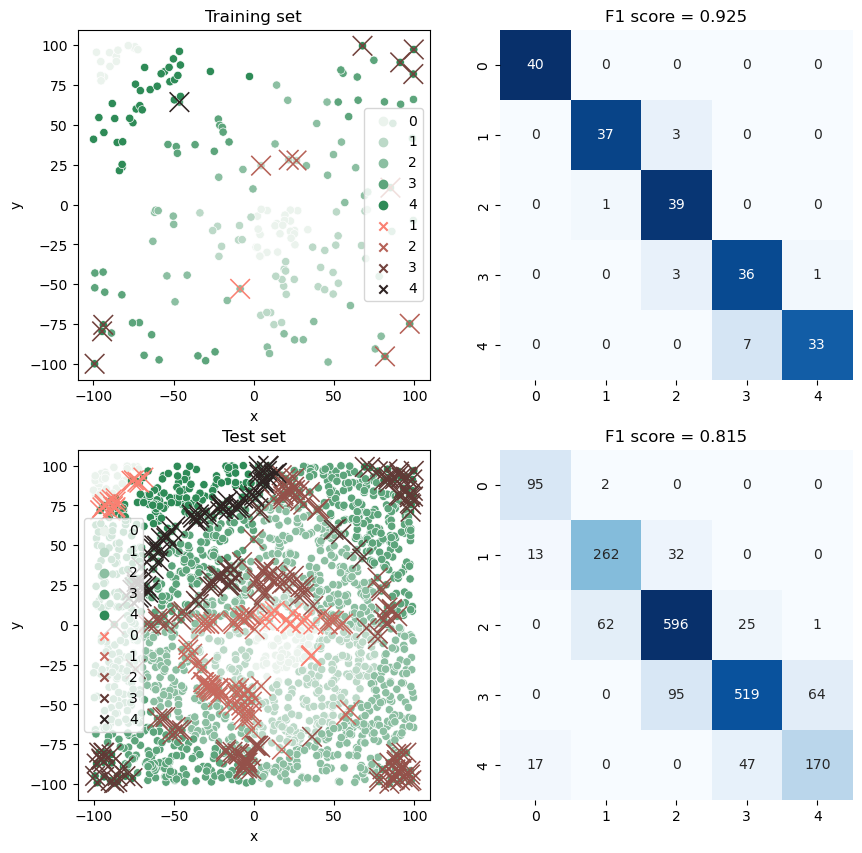

In [3]:
warnings.filterwarnings("ignore")
plot_classification(best_model_regnal,df_train,df_test)
warnings.filterwarnings("default")

#### rings3-balance

In [42]:
np.random.seed(42)
df_train = pd.read_csv("data/classification/rings3-balance-training.csv")
df_test = pd.read_csv("data/classification/rings3-balance-test.csv")


In [227]:
df_train

,x,y,c
0,-51.444410,96.406766,0
1,35.512763,11.880533,0
2,3.504740,16.612403,0
3,-95.913214,-91.379244,0
4,4.620613,-10.885877,0
...,...,...,...
2055,-75.513819,-44.850778,2
2056,-45.154384,57.234903,2
2057,52.081905,-85.686216,2
2058,-21.630320,61.778102,2


In [41]:
warnings.filterwarnings("ignore")
mlp = MLP(input_dim=2,output_dim=3,hidden_dims=[30,30,30],classification=True,layers_activation=leaky_relu)
times_base, loss_base, epochs_base, best_loss_base, best_model_base = mlp.fit(df_train[["x","y"]],df_train["c"],epochs=2000,learning_rate=0.005,verbose=True,shuffle=True,batch_size=64,regularisation_coef=0, score_function=partial(f1_score,average="macro"),score_stop=0.99)
warnings.filterwarnings("default")

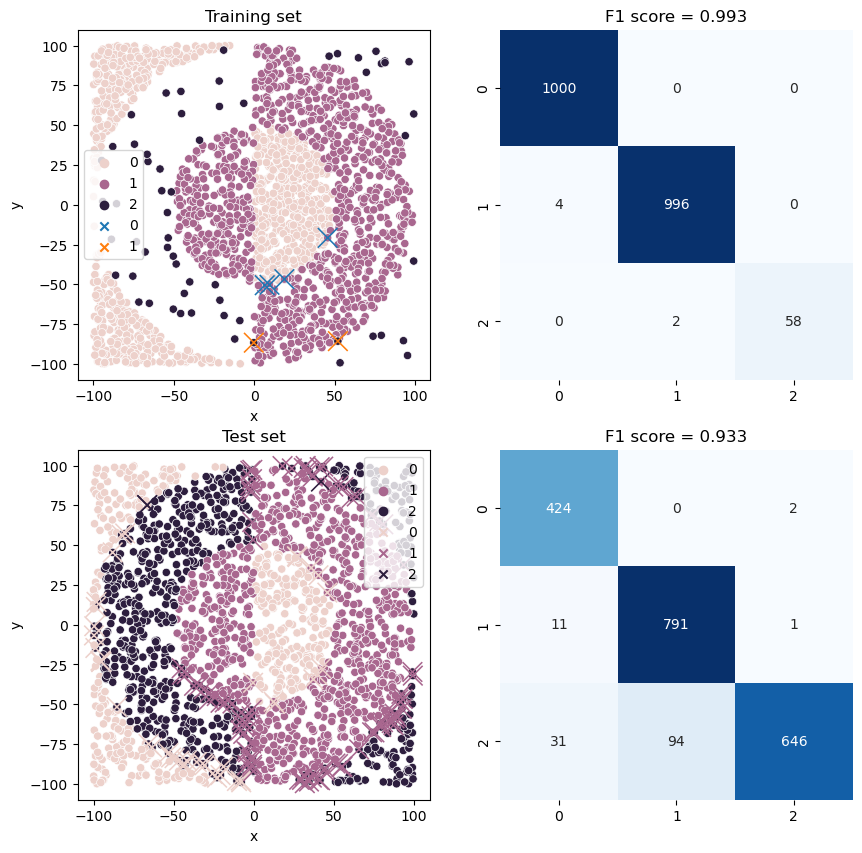

In [42]:
warnings.filterwarnings("ignore")
plot_classification(best_model_base,df_train,df_test,some_error=True)
warnings.filterwarnings("default")


In [87]:
warnings.filterwarnings("ignore")
mlp = MLP(input_dim=2,output_dim=3,hidden_dims=[30,30,30],classification=True,layers_activation=leaky_relu)
times_reg, loss_reg, epochs_reg, best_loss_reg, best_model_reg = mlp.fit(df_train[["x","y"]],df_train["c"],epochs=2000,learning_rate=0.005,verbose=True,shuffle=True,batch_size=64,regularisation_coef=0.01, score_function=partial(f1_score,average="macro"),score_stop=0.99)
warnings.filterwarnings("default")

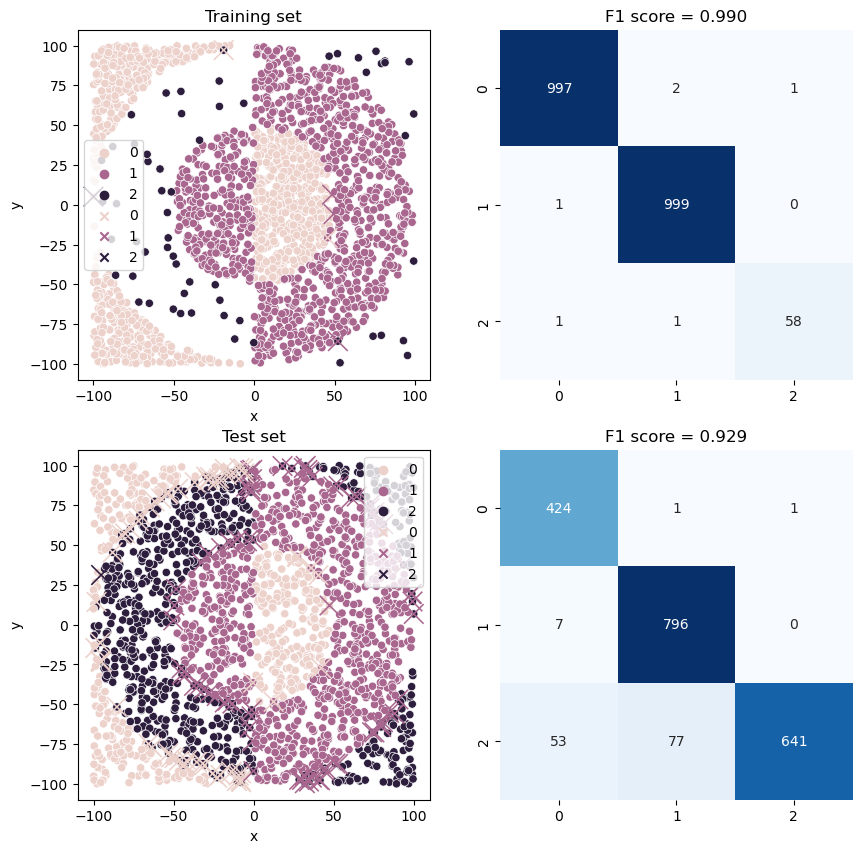

In [89]:
warnings.filterwarnings("ignore")
plot_classification(mlp,df_train,df_test,some_error=True)
warnings.filterwarnings("default")


In [52]:
warnings.filterwarnings("ignore")
mlp = MLP(input_dim=2,output_dim=3,hidden_dims=[30,30,30],classification=True,layers_activation=leaky_relu)
times_val, loss_val, epochs_val, best_loss_val, best_model_val = mlp.fit(df_train[["x","y"]],df_train["c"],epochs=20000,learning_rate=0.001,validation_split=0.2,val_patience=500,batch_size=8,regularisation_coef=0, score_function=partial(f1_score,average="macro"),score_stop=1)
warnings.filterwarnings("default")

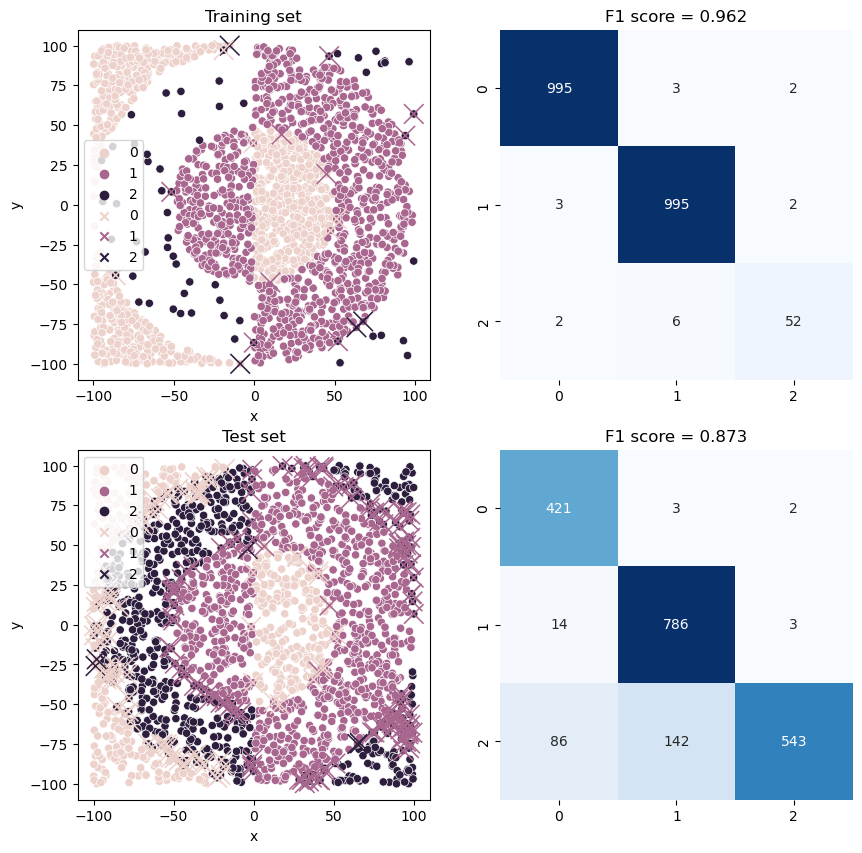

In [102]:
warnings.filterwarnings("ignore")
plot_classification(mlp,df_train,df_test,some_error=True)
warnings.filterwarnings("default")


In [48]:
warnings.filterwarnings("ignore")
mlp = MLP(input_dim=2,output_dim=3,hidden_dims=[30,30,30],classification=True,layers_activation=leaky_relu)
times_regval, loss_regval, epochs_regval, best_loss_regval, best_model_regval = mlp.fit(df_train[["x","y"]],df_train["c"],epochs=100000,learning_rate=0.001,validation_split=0.2,val_patience=1000,batch_size=16,regularisation_coef=0.05, score_function=partial(f1_score,average="macro"),score_stop=1)
warnings.filterwarnings("default")

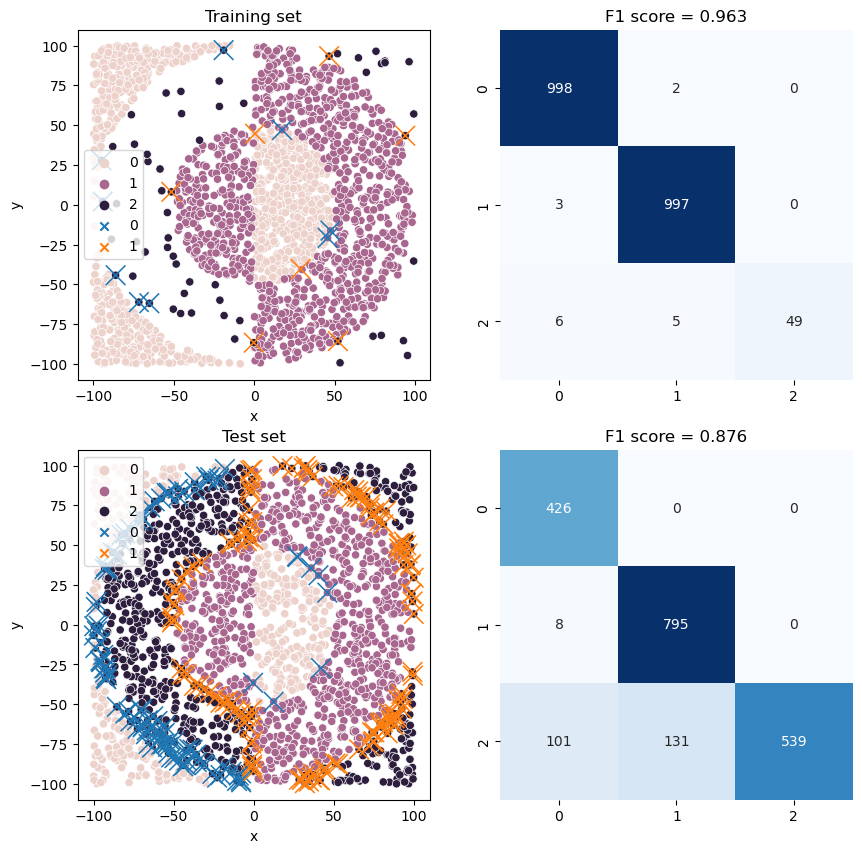

In [47]:
warnings.filterwarnings("ignore")
plot_classification(best_model_regval,df_train,df_test,some_error=True)
warnings.filterwarnings("default")

#### xor3-balance

In [173]:
df_train = pd.read_csv("data/classification/xor3-balance-training.csv")
df_test = pd.read_csv("data/classification/xor3-balance-test.csv")
df_train


,x,y,c
0,-86.230963,-45.018574,0
1,60.883229,50.779619,0
2,-8.728612,5.851914,0
3,71.094995,88.402734,0
4,-49.498710,60.214482,0
...,...,...,...
1045,-35.229949,-23.929730,1
1046,-76.418538,20.736320,1
1047,17.164533,89.259443,1
1048,22.126832,-51.500792,1


In [121]:
warnings.filterwarnings("ignore")
mlp = MLP(input_dim=2,output_dim=2,hidden_dims=[30,30,30],classification=True,layers_activation=leaky_relu)
times_base, loss_base, epochs_base, best_loss_base, best_model_base = mlp.fit(df_train[["x","y"]],df_train["c"],epochs=2000,learning_rate=0.001,batch_size=64,regularisation_coef=0, score_function=partial(f1_score,average="macro"),score_stop=0.99)
warnings.filterwarnings("default")

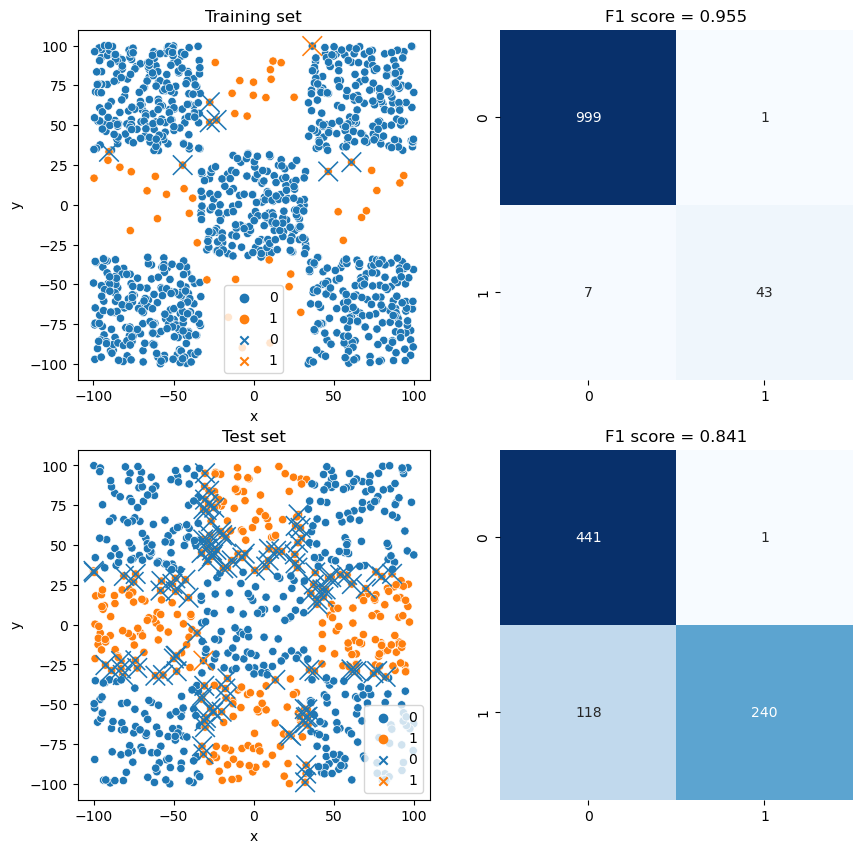

In [122]:
warnings.filterwarnings("ignore")
plot_classification(best_model_base,df_train,df_test,some_error=True)
warnings.filterwarnings("default")


In [123]:
warnings.filterwarnings("ignore")
mlp = MLP(input_dim=2,output_dim=2,hidden_dims=[30,30,30],classification=True,layers_activation=leaky_relu)
times_reg, loss_reg, epochs_reg, best_loss_reg, best_model_reg = mlp.fit(df_train[["x","y"]],df_train["c"],epochs=2000,learning_rate=0.005,batch_size=64,regularisation_coef=0.5, score_function=partial(f1_score,average="macro"),score_stop=0.99)
warnings.filterwarnings("default")

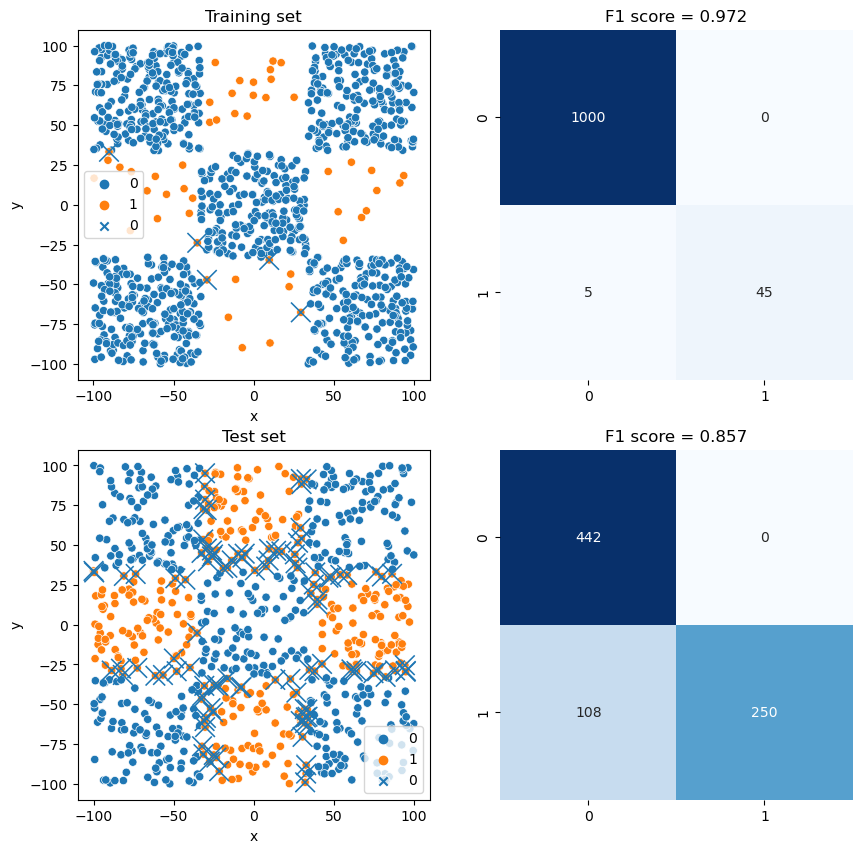

In [126]:
warnings.filterwarnings("ignore")
plot_classification(mlp,df_train,df_test,some_error=True)
warnings.filterwarnings("default")


In [139]:
warnings.filterwarnings("ignore")
mlp = MLP(input_dim=2,output_dim=2,hidden_dims=[30,30,30],classification=True,layers_activation=leaky_relu)
times_val, loss_val, epochs_val, best_loss_val, best_model_val = mlp.fit(df_train[["x","y"]],df_train["c"],epochs=5000,learning_rate=0.001,batch_size=64,regularisation_coef=0,val_patience=1000,validation_split=0.2, score_function=partial(f1_score,average="macro"),score_stop=0.99)
warnings.filterwarnings("default")

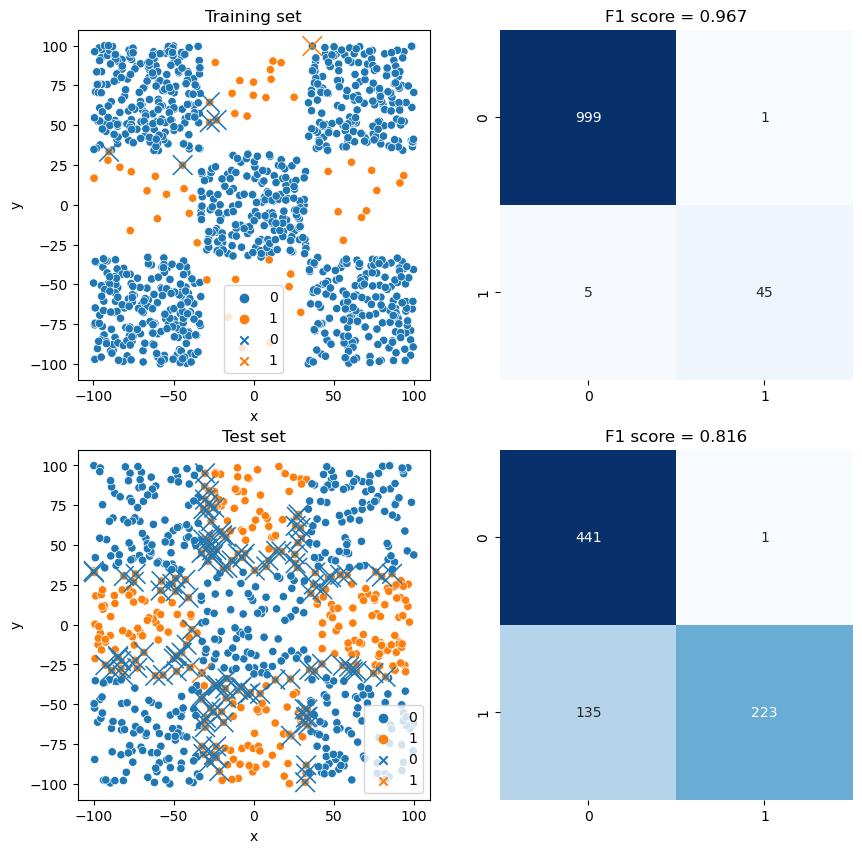

In [141]:
warnings.filterwarnings("ignore")
plot_classification(best_model_val,df_train,df_test,some_error=True)
warnings.filterwarnings("default")

In [180]:
warnings.filterwarnings("ignore")
mlp = MLP(input_dim=2,output_dim=2,hidden_dims=[30,30,30],classification=True,layers_activation=leaky_relu)
times_regval, loss_regval, epochs_regval, best_loss_regval, best_model_regval = mlp.fit(df_train[["x","y"]],df_train["c"],epochs=2000,learning_rate=0.001,batch_size=64,regularisation_coef=0.7,val_patience=500,validation_split=0.2, score_function=partial(f1_score,average="macro"),score_stop=0.99)
warnings.filterwarnings("default")

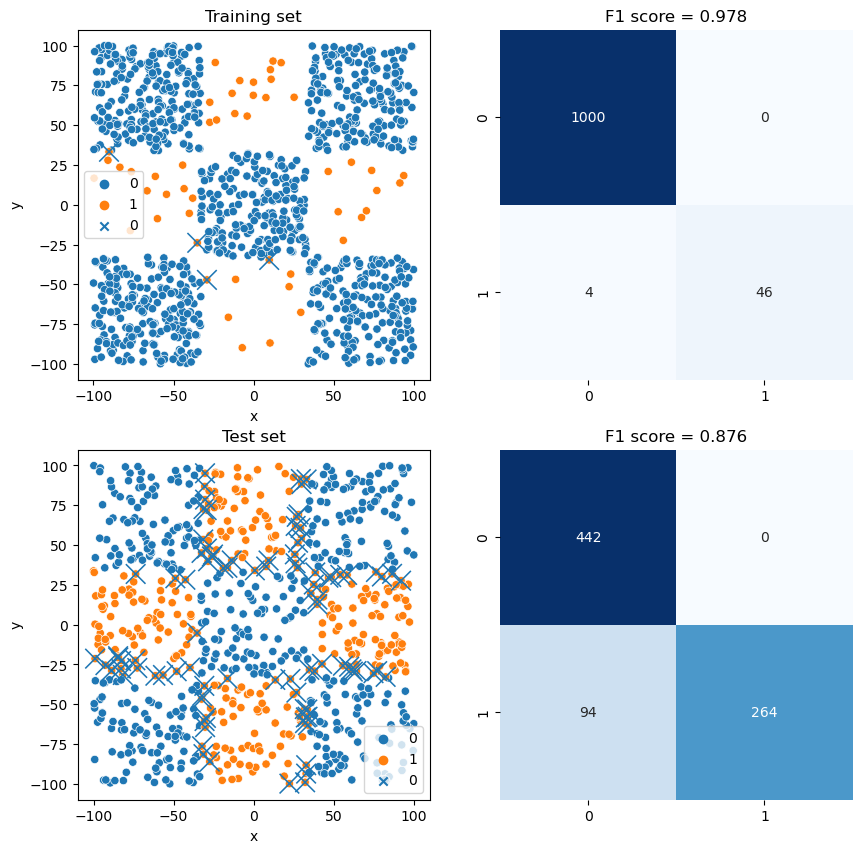

In [175]:
warnings.filterwarnings("ignore")
plot_classification(best_model_regval,df_train,df_test,some_error=True)
warnings.filterwarnings("default")


### Wnioski
Wydaje się że:
* regularyzacja zwykle pomaga w wytreniowaniu na takich zbiorach
* same zatrzymywanie na zbiorze walidacyjnym nie wydaje sie działać, może by się lepiej sprawdzało na większych zbiorach.
* regularyzacja wag + zatrzymywanie na zbiorze walidacyjnym wydaje się spoko działać bo osiągamy zwykle to samo co przy samej regularyzacji, ale jeszcze model wie kiedy się zatrzymać
